In [1]:
import numpy as np
import matplotlib.pyplot as plt
from catboost import CatBoostRegressor
from sklearn.datasets import fetch_california_housing
import statsmodels.api as sm
import seaborn as sns

# Загрузка данных и первичная обработка

In [2]:
import pandas as pd

housing = fetch_california_housing()
X = pd.DataFrame(housing.data, columns=housing.feature_names)

In [3]:
y = housing.target
data = pd.concat([X, pd.Series(y)], axis=1)

In [4]:
data

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,0
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


In [5]:
data.rename({'0': 'target'}, inplace=True)

In [6]:
data[0] = data[0]*100_000

In [7]:
data

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,0
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,452600.0
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,358500.0
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,352100.0
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,341300.0
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,342200.0
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,78100.0
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,77100.0
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,92300.0
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,84700.0


In [8]:
data.rename(columns={0: 'target'}, inplace=True)

In [9]:
group_by_raion = data.groupby('target').size()
group_by_raion

target
14999.0       4
17500.0       1
22500.0       4
25000.0       1
26600.0       1
           ... 
498800.0      1
499000.0      1
499100.0      1
500000.0     27
500001.0    965
Length: 3842, dtype: int64

<Axes: xlabel='Longitude', ylabel='Latitude'>

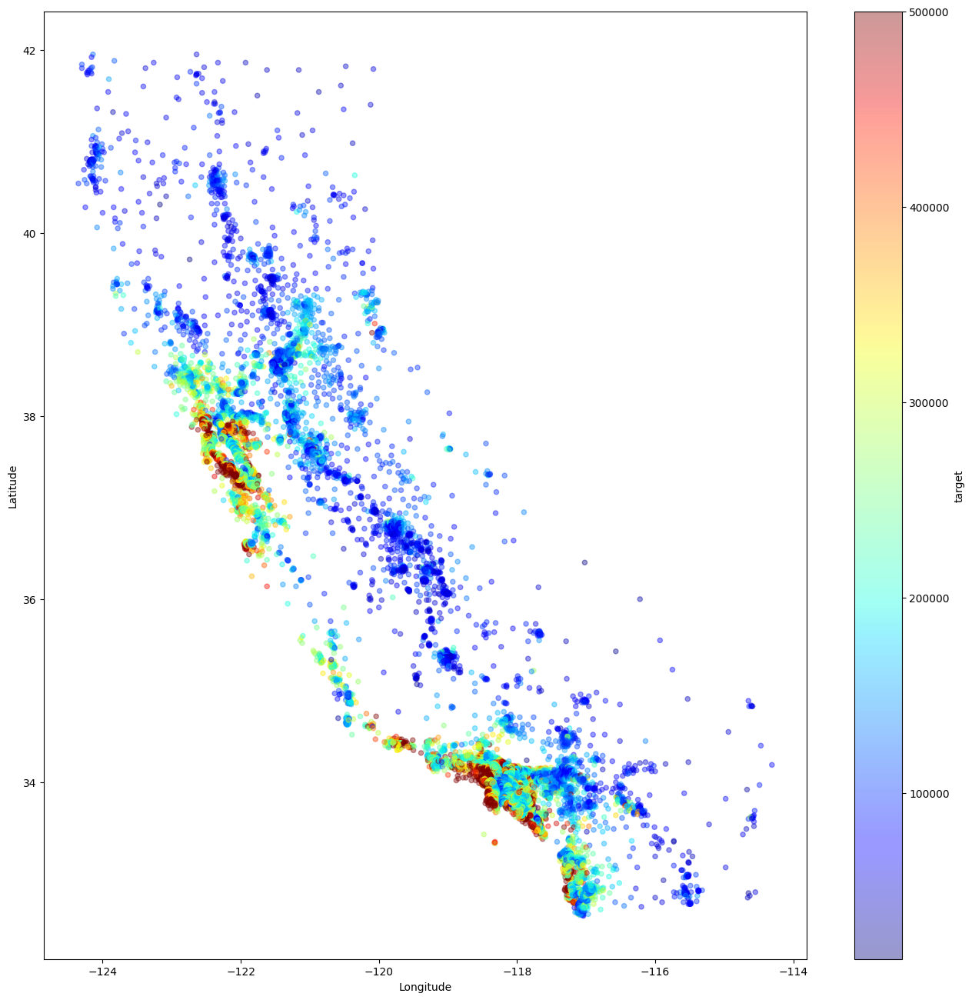

In [10]:
data.plot(kind='scatter', x='Longitude', y='Latitude', alpha=0.4,
          figsize=(16,16), c='target', cmap=plt.get_cmap('jet'), colorbar=True)

У нас вырисовывается 3 кластера очень дорогих домов, которые, судя по всему ближе всего к морю

# Exploratary Data Analysis (EDA)

Далее посмотрим на распределение признаков

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


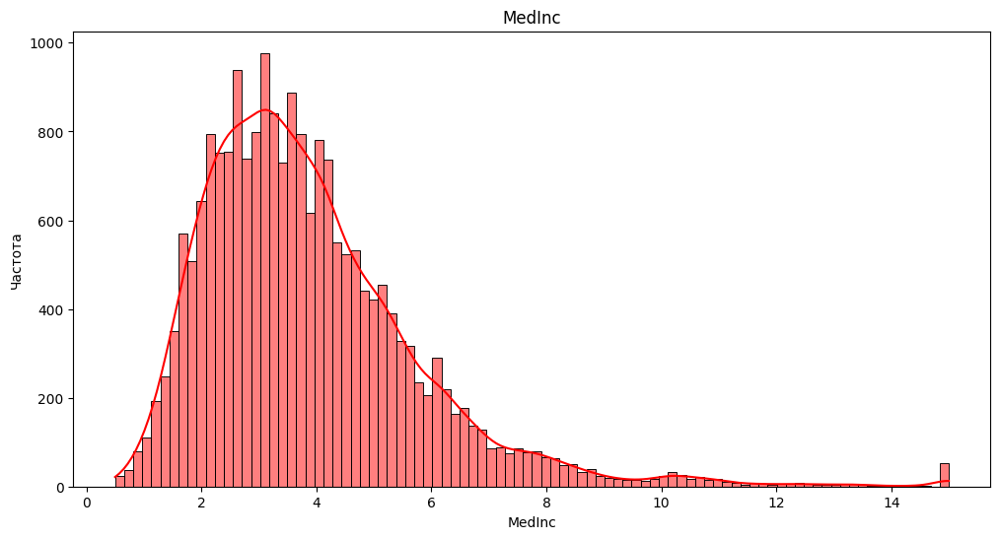

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


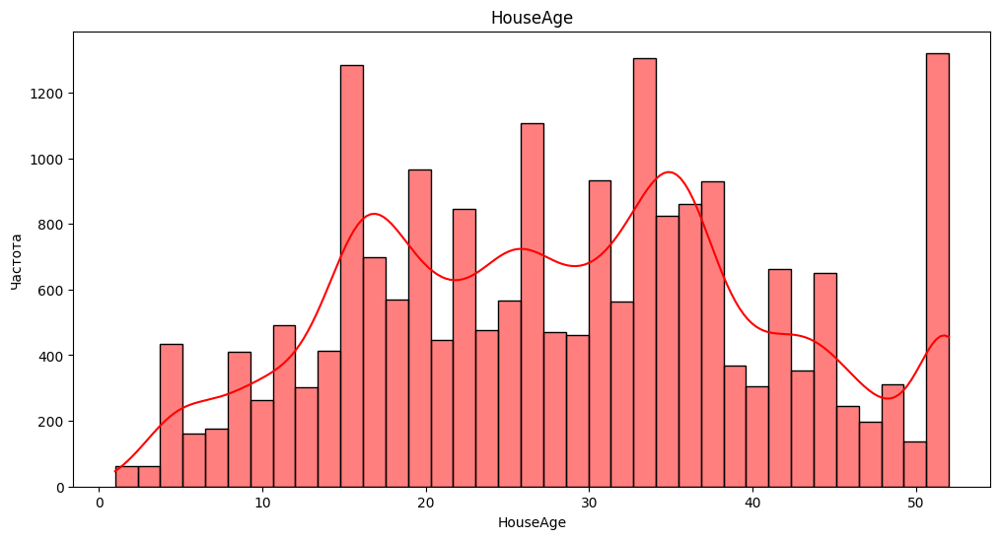

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


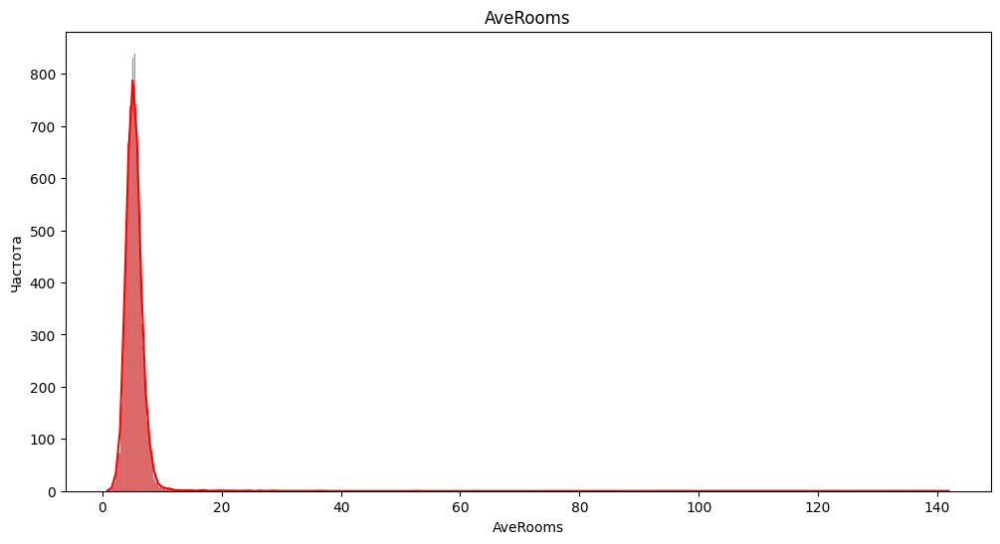

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


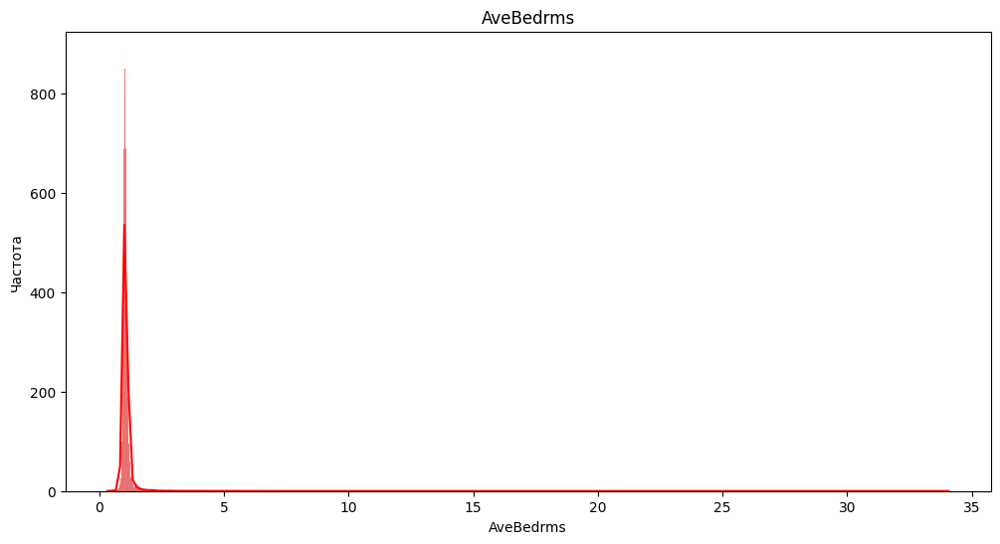

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


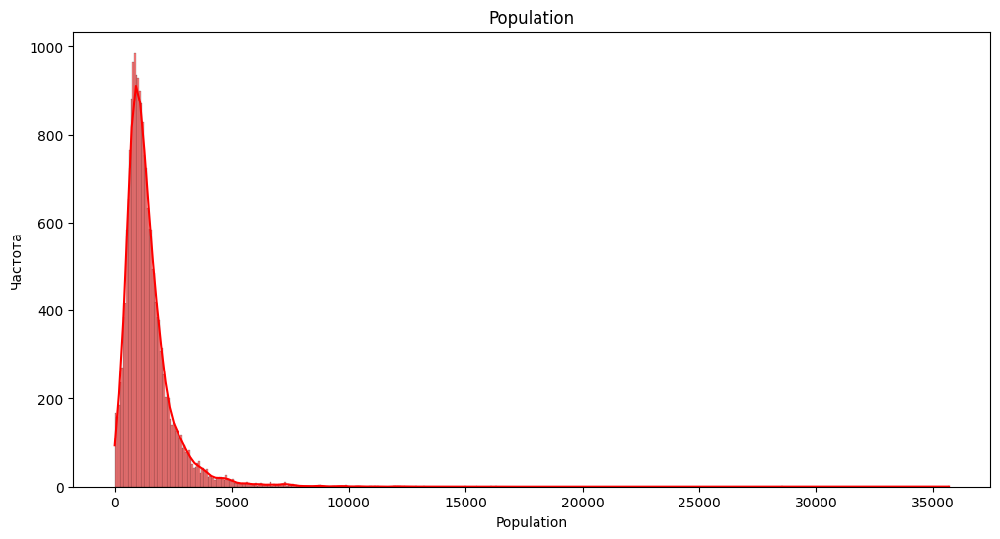

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


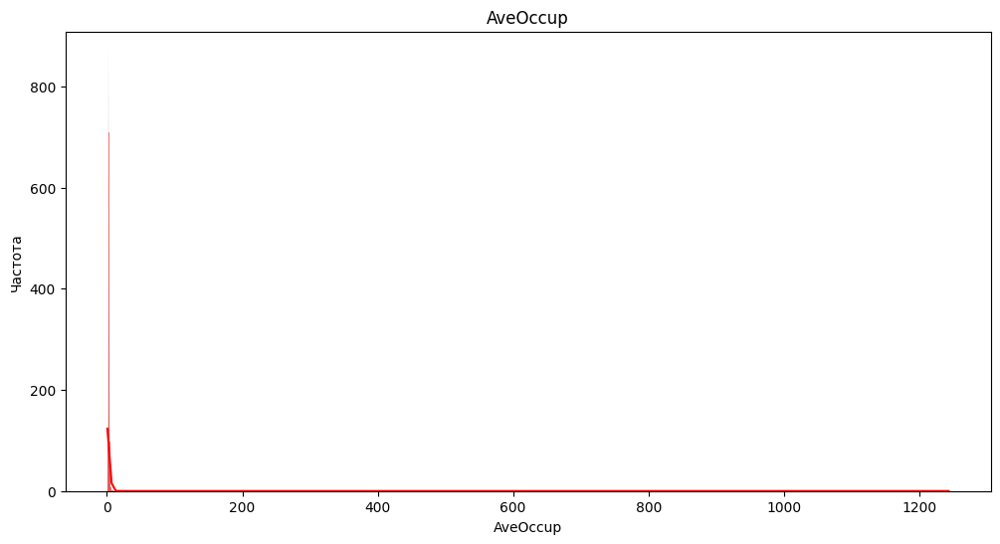

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


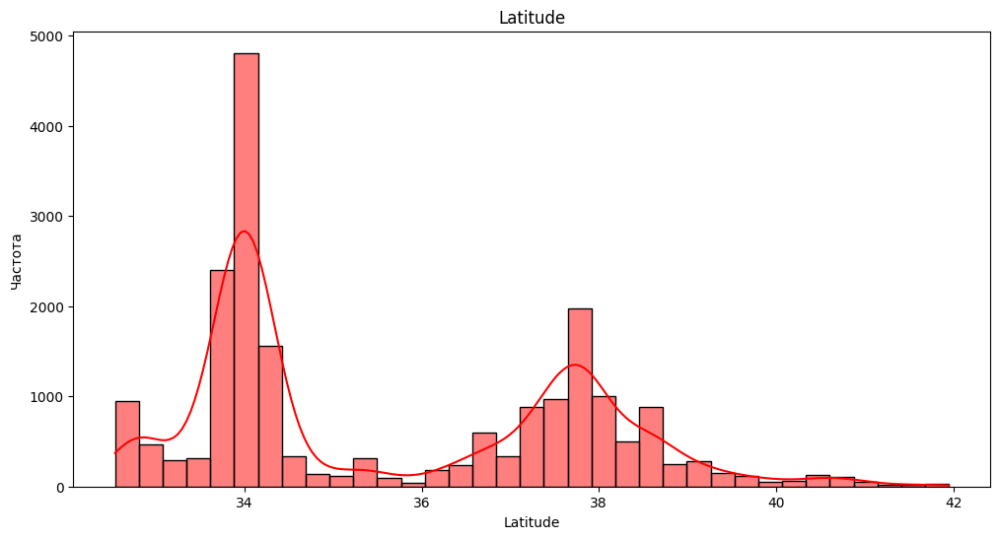

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


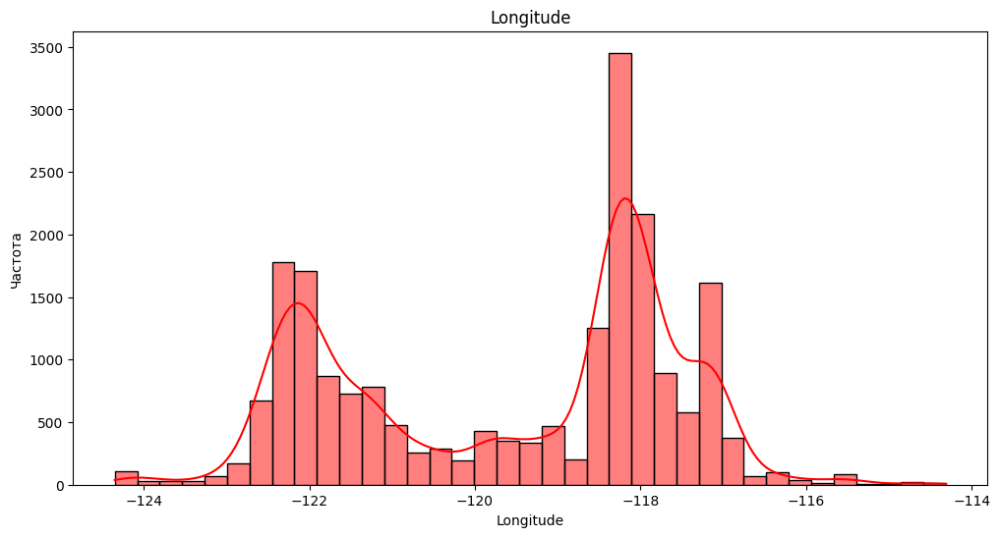

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


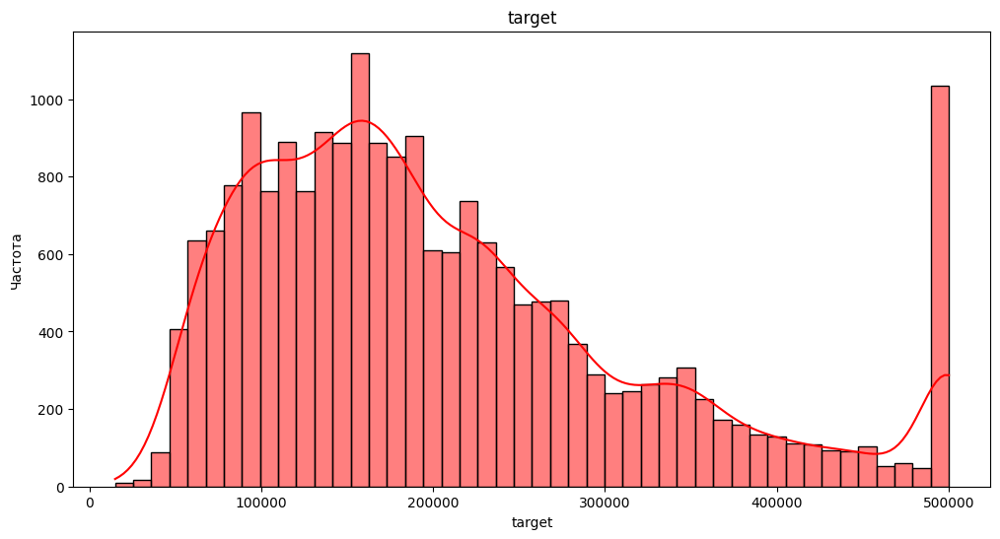

In [11]:
for column in data.columns:
    plt.figure(figsize=(12, 6))
    sns.histplot(data[column], kde=True, color='red')
    plt.title(f'{column}')
    plt.xlabel(column)
    plt.ylabel('Частота')
    plt.show()

1. Из данных видно, что 4 признака имеют большой эксцесс (хвост в распределении), так что будет иметь смысл прологорифмировать их перед подачей в модель, тк это может отрицательно сказаться на качестве обучения

2. Наш таргет очень странно распределен: видно, что распределение по типу скошенное влево, но в конце есть столбец, который выбивается, это может значить, что наши цены домов ограничены 500_000, но явно имеются дома ценой больше 500_000, цены которых не вошли в датасет

/opt/conda/lib/python3.10/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


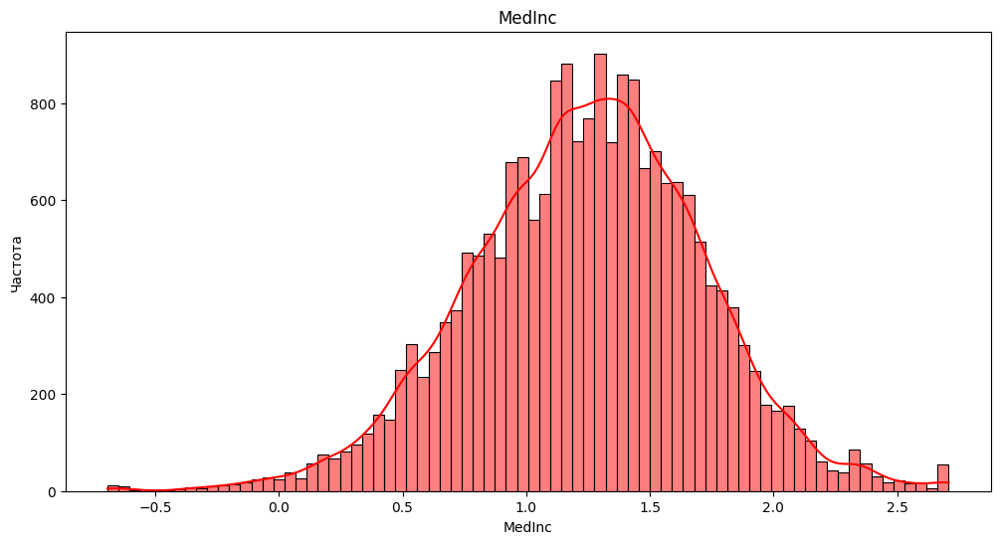

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


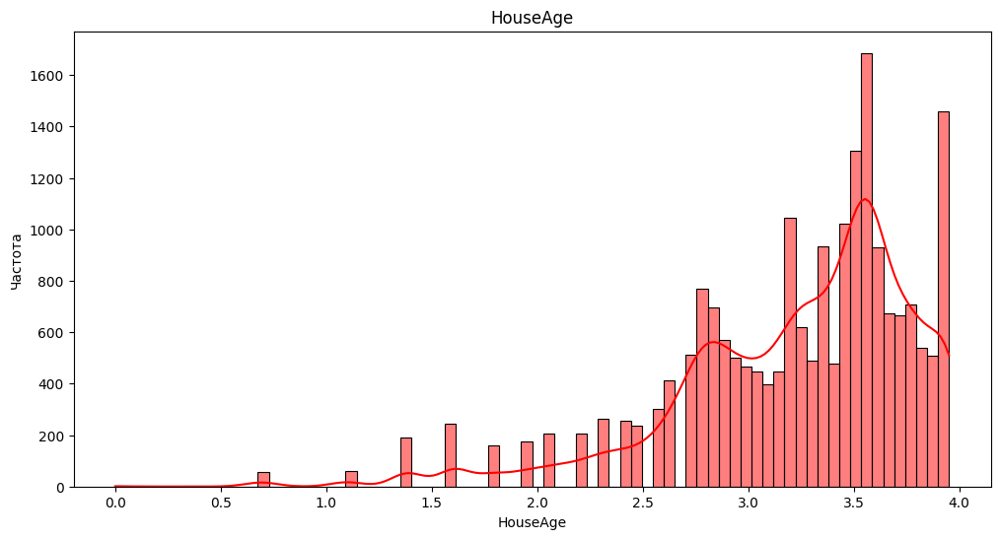

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


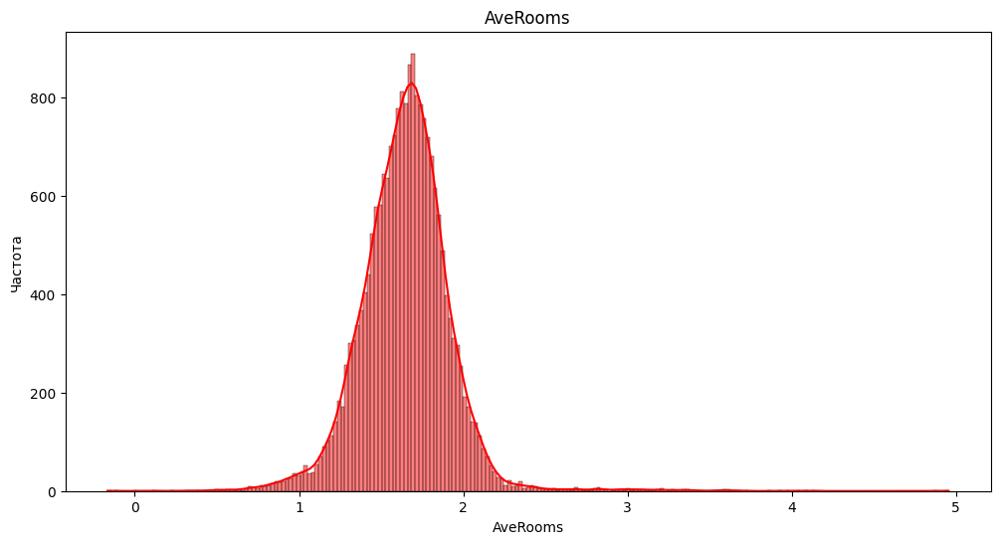

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


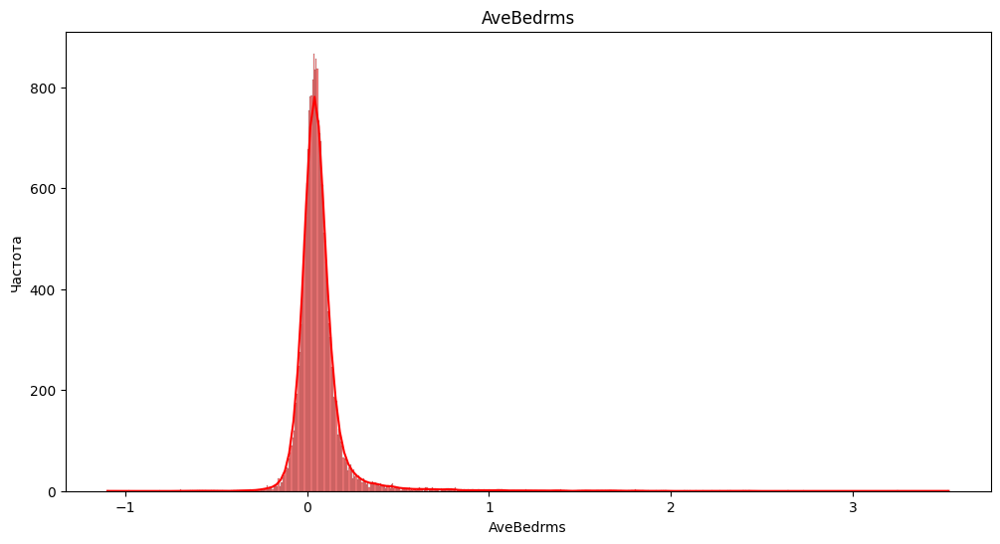

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


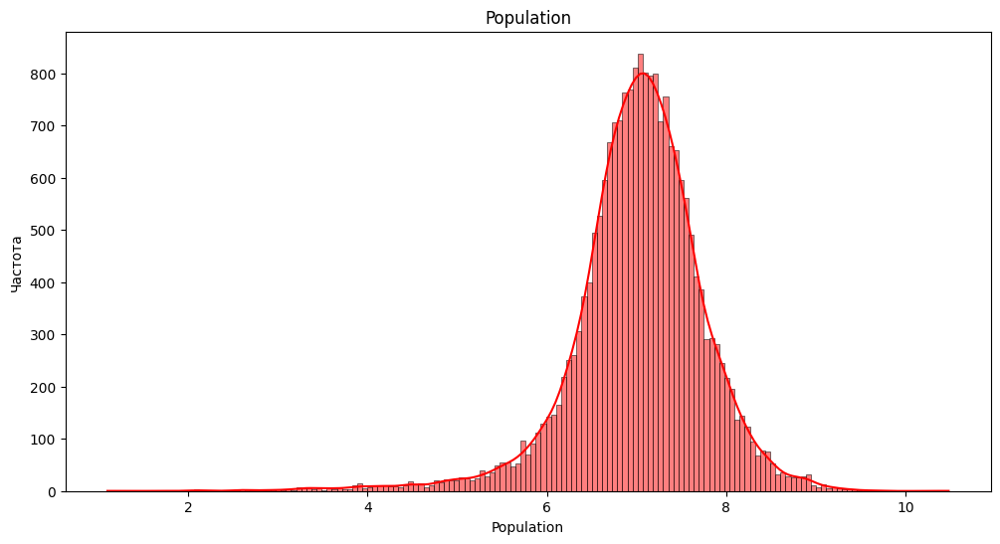

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


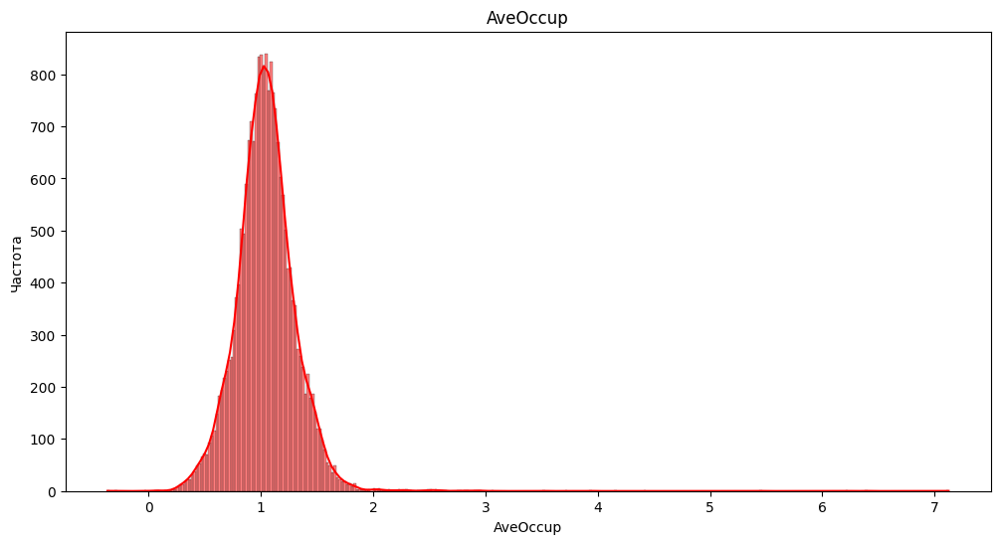

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


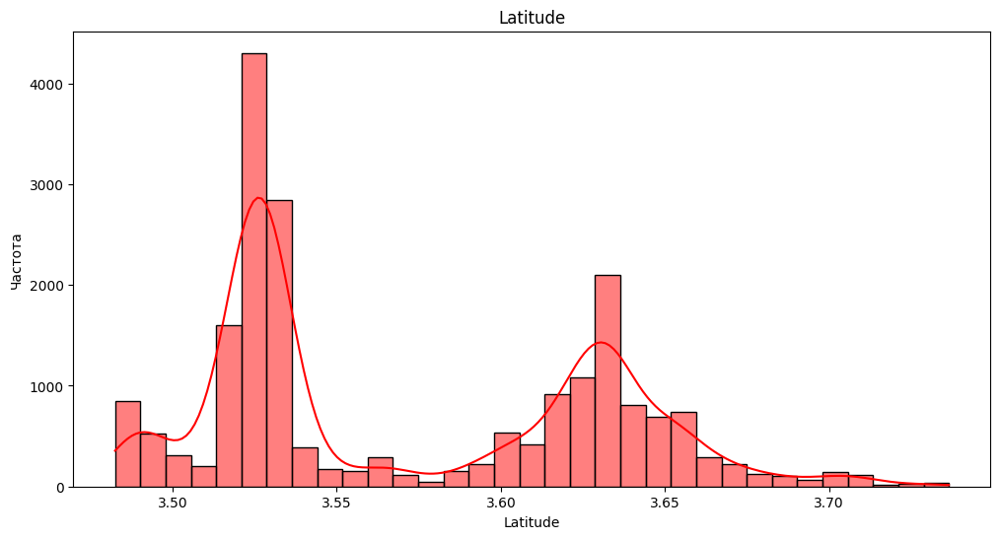

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


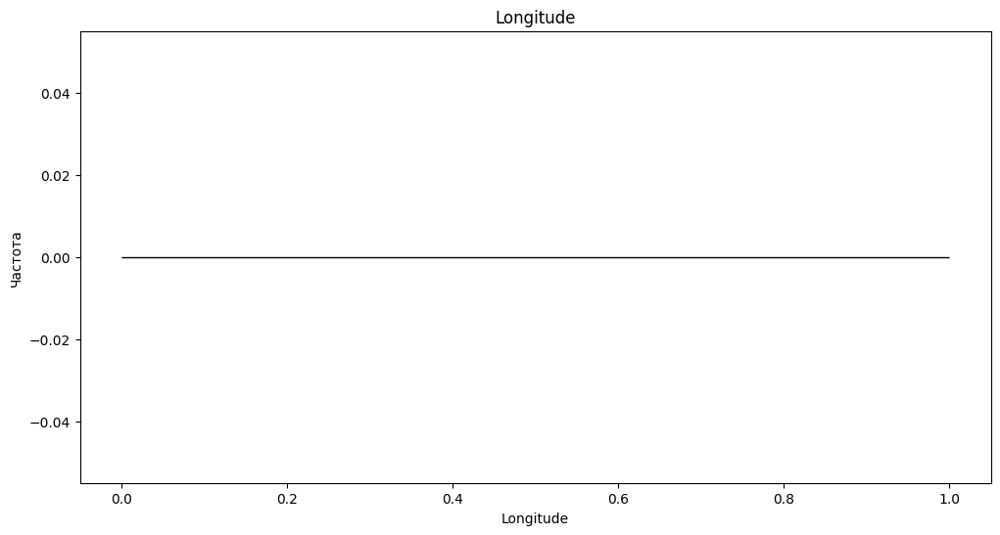

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


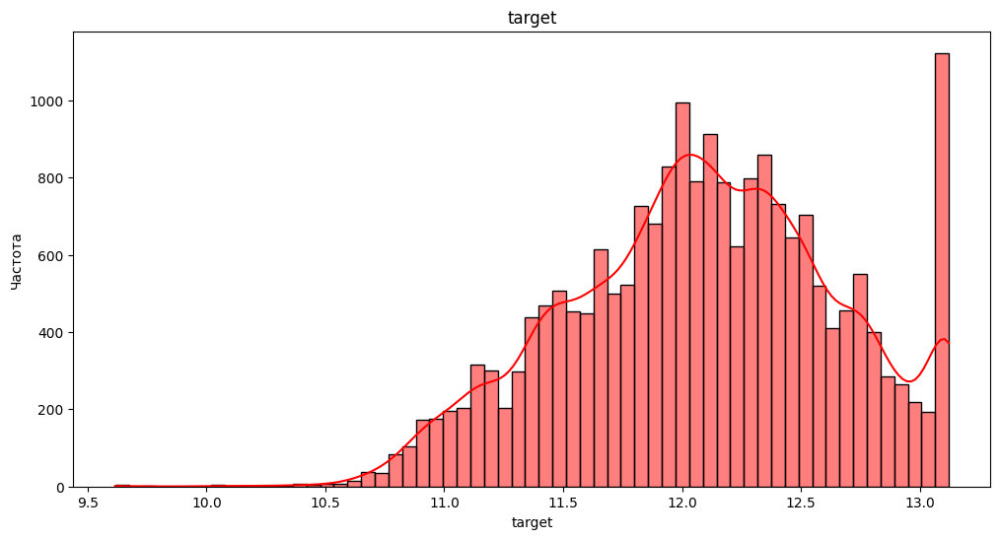

In [12]:
# попытаемся прологорифмировать данные и посмотреть на их распределение
data_log = np.log(data.copy())
for column in data_log.columns:
    plt.figure(figsize=(12, 6))
    sns.histplot(data_log[column], kde=True, color='red')
    plt.title(f'{column}')
    plt.xlabel(column)
    plt.ylabel('Частота')
    plt.show()

Теперь видно, что в тех 4 категориях хвосты гораздо меньше

Следующим этапом анализа разобъем данные на 5 ценовых категорий и для каждой посмотрим гистограммы распределения (вдруг увидим что-то интересное)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


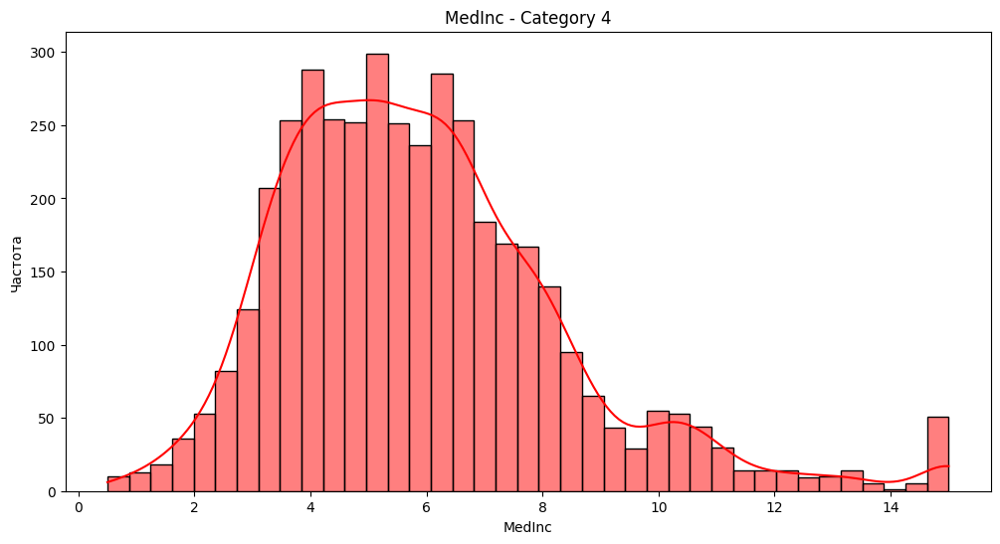

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


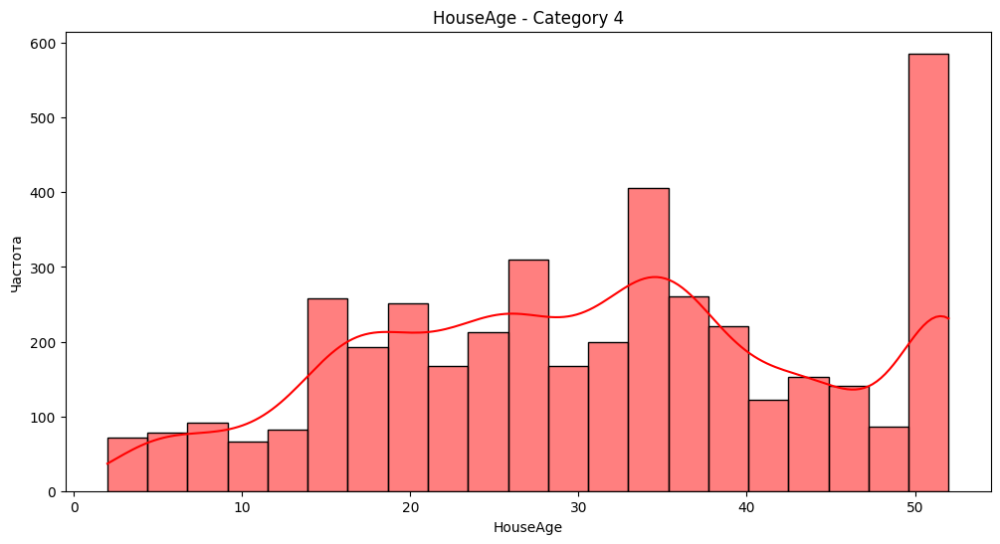

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


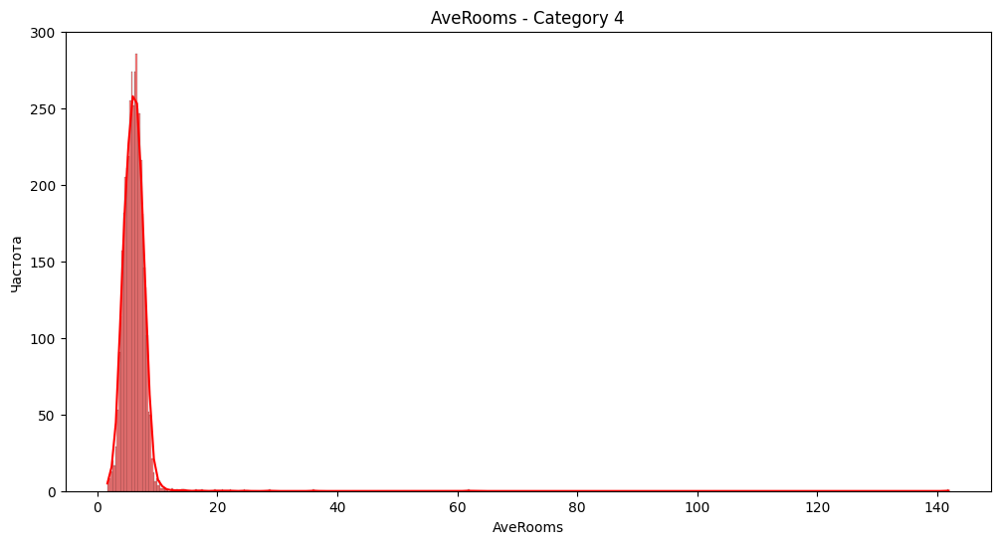

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


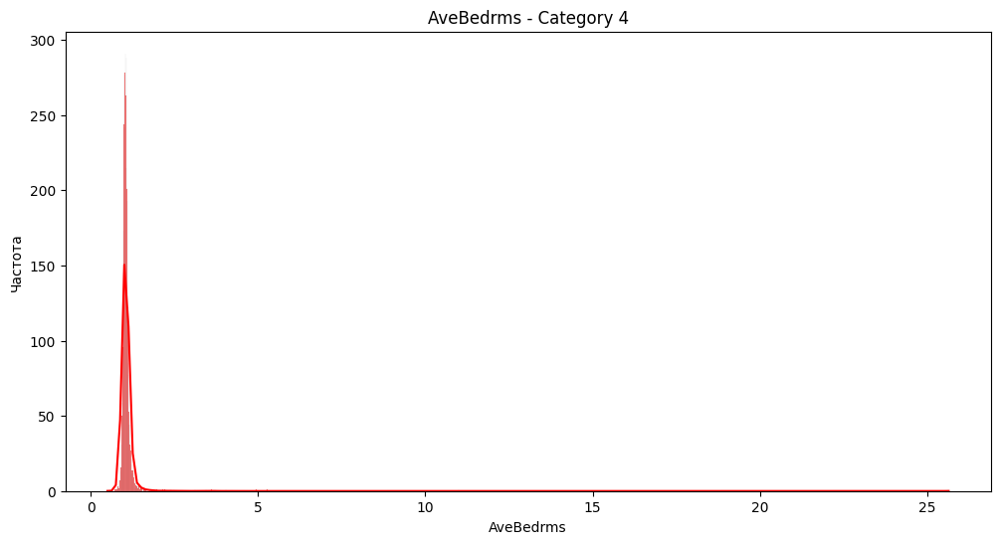

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


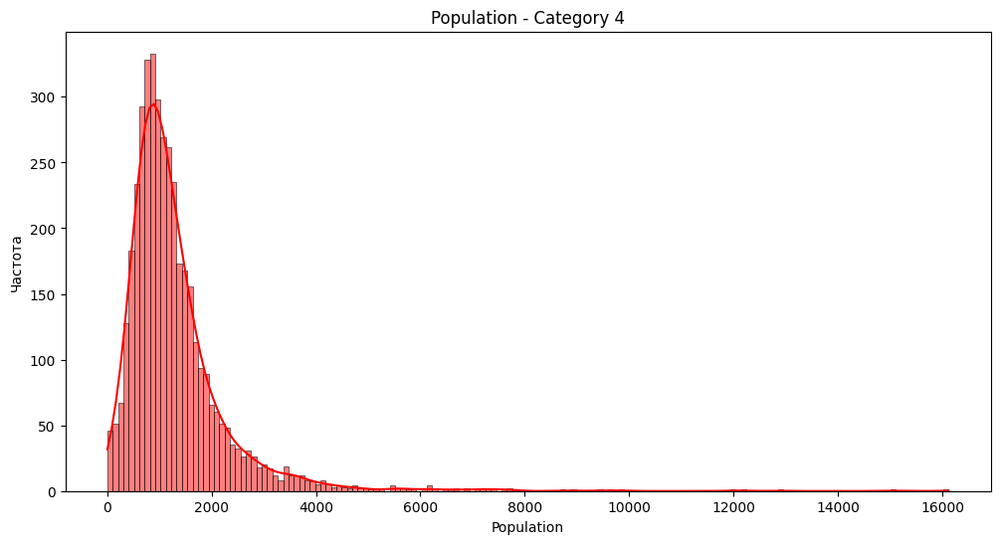

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


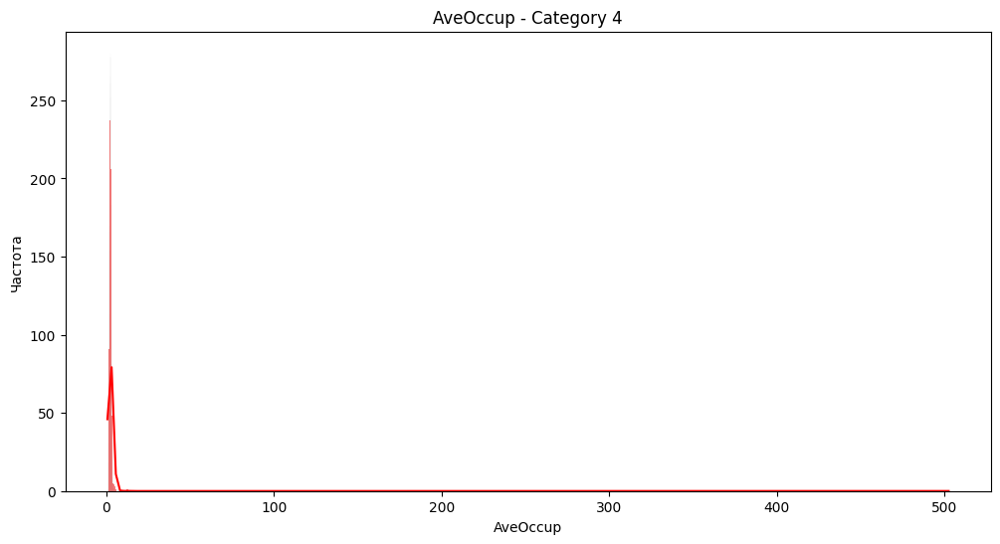

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


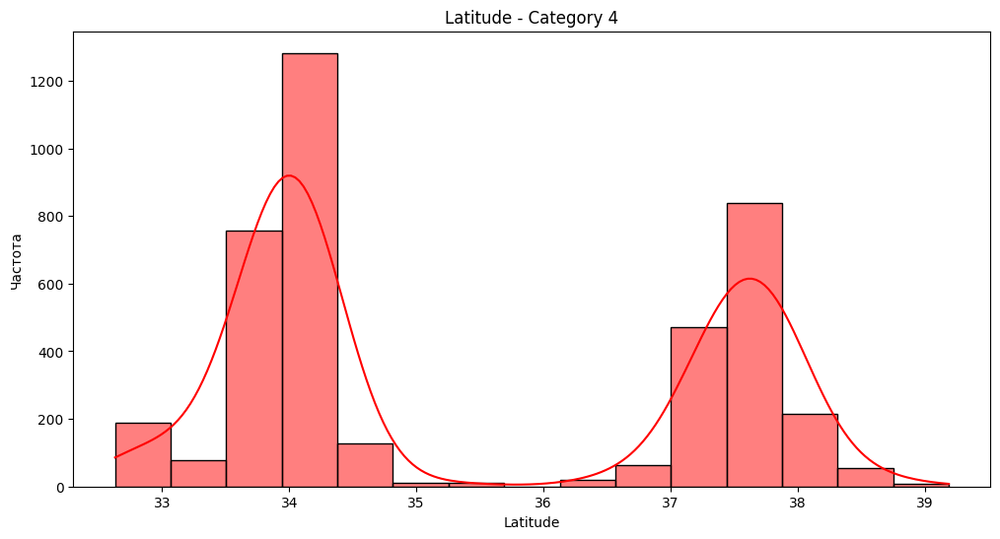

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


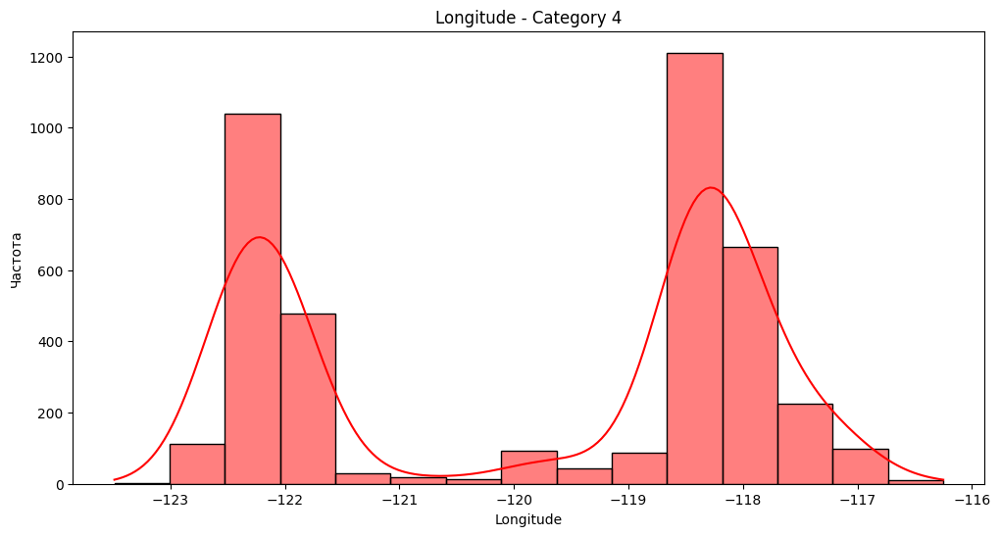

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


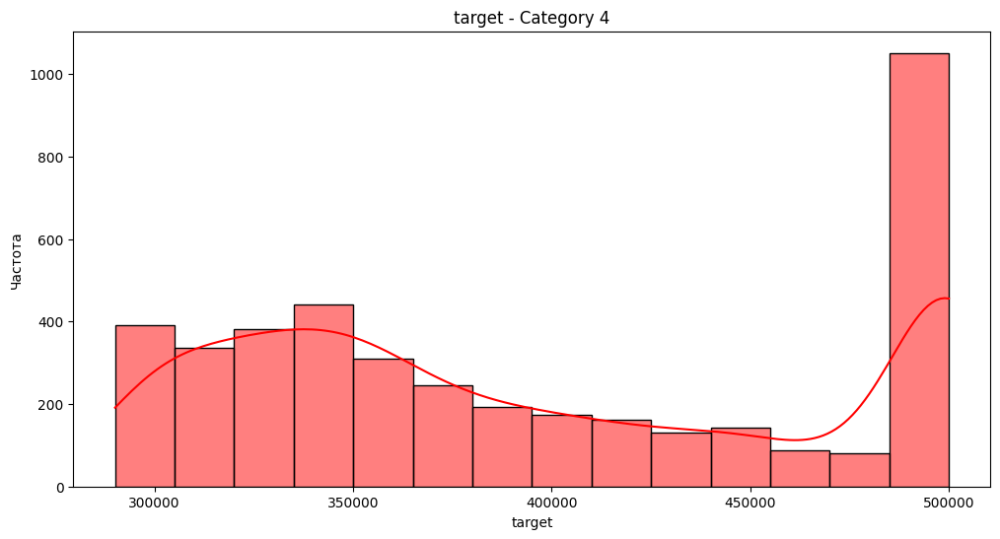

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


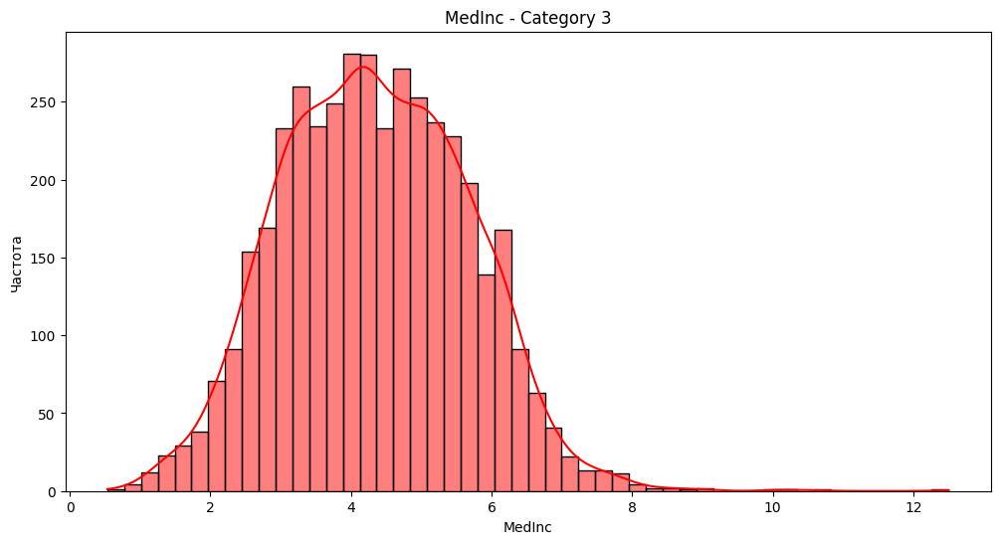

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


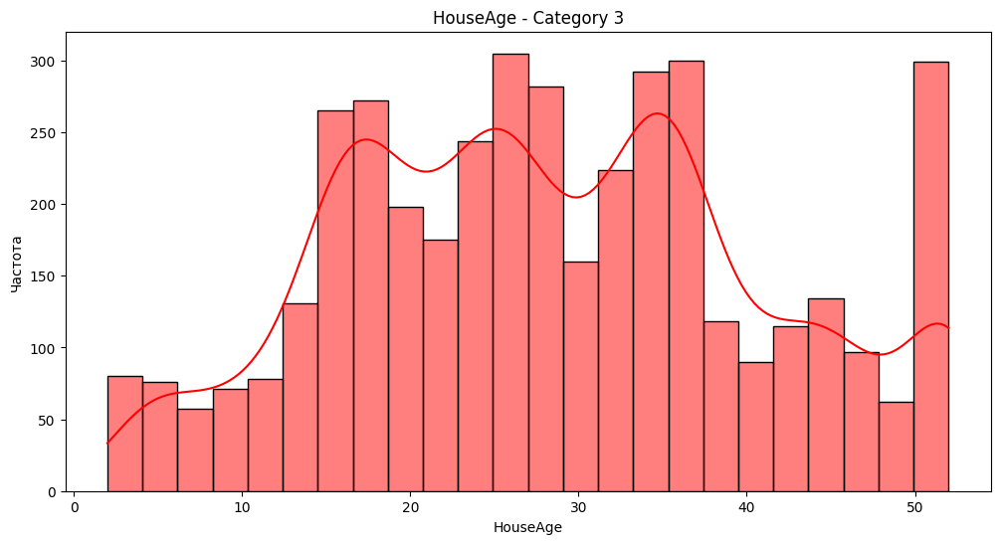

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


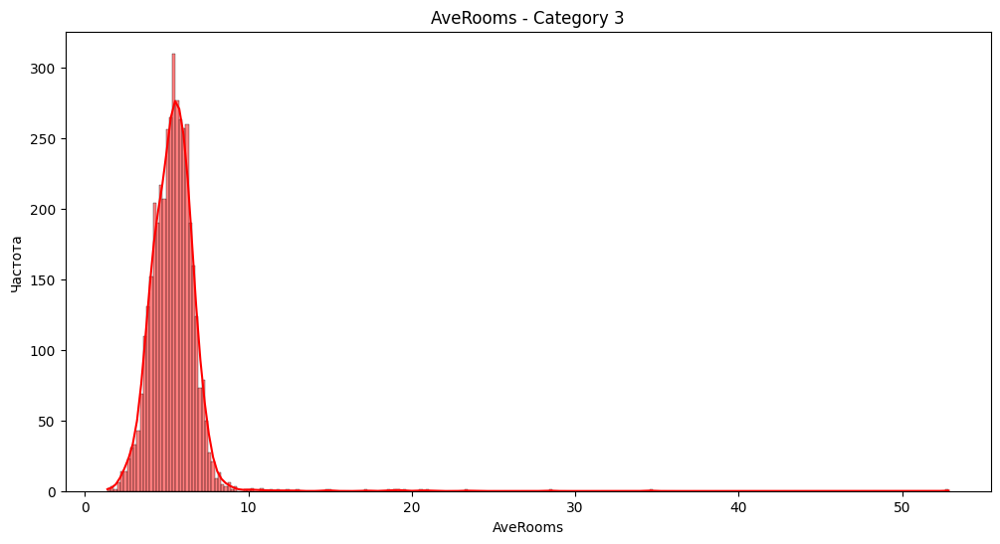

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


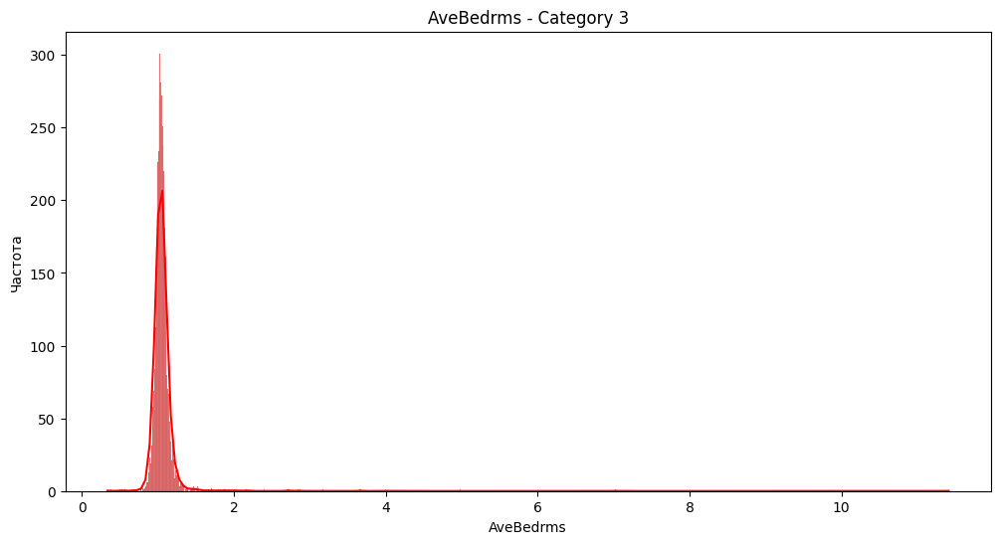

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


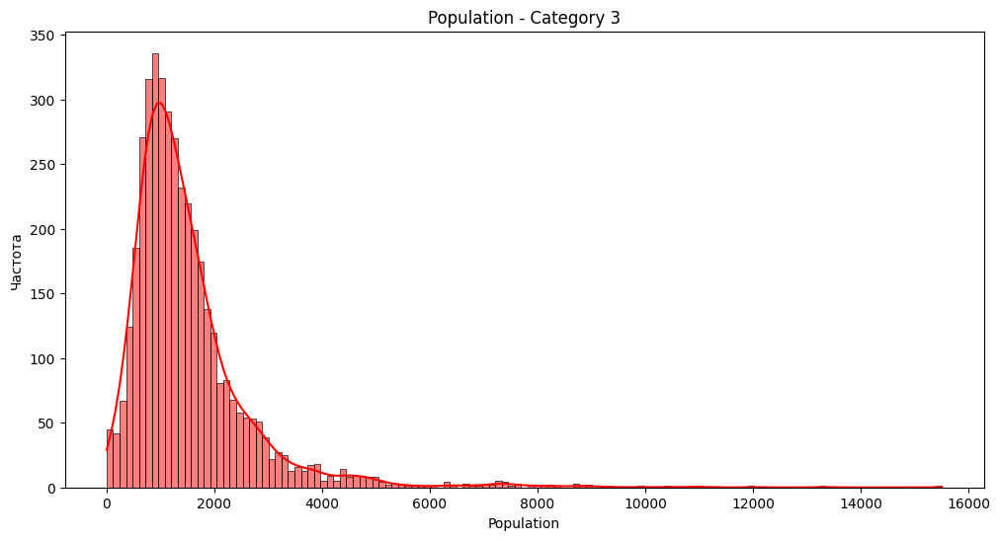

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


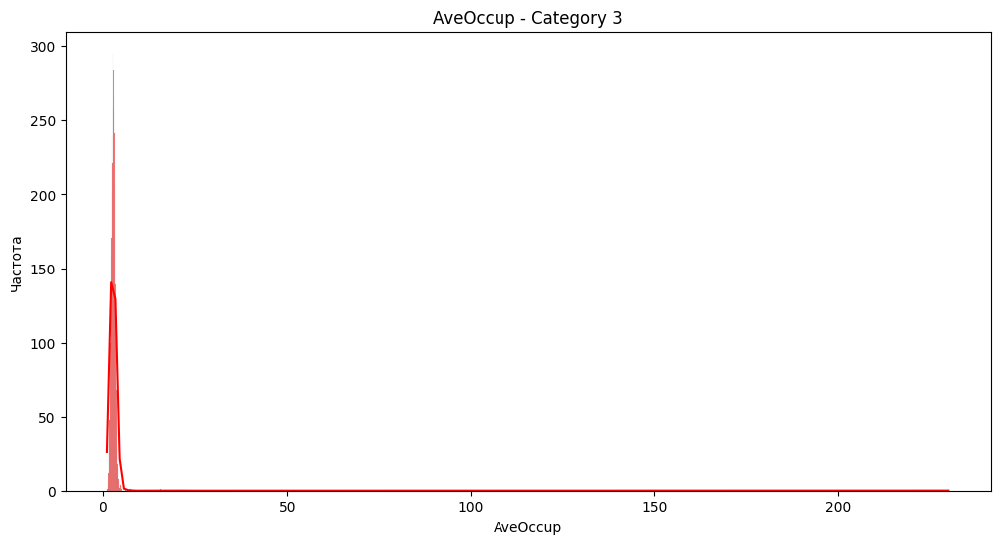

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


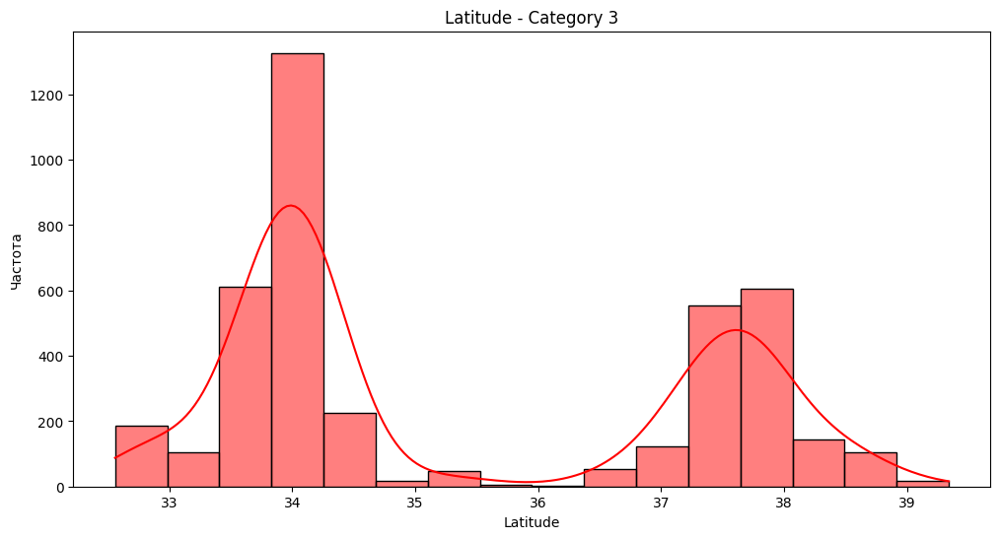

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


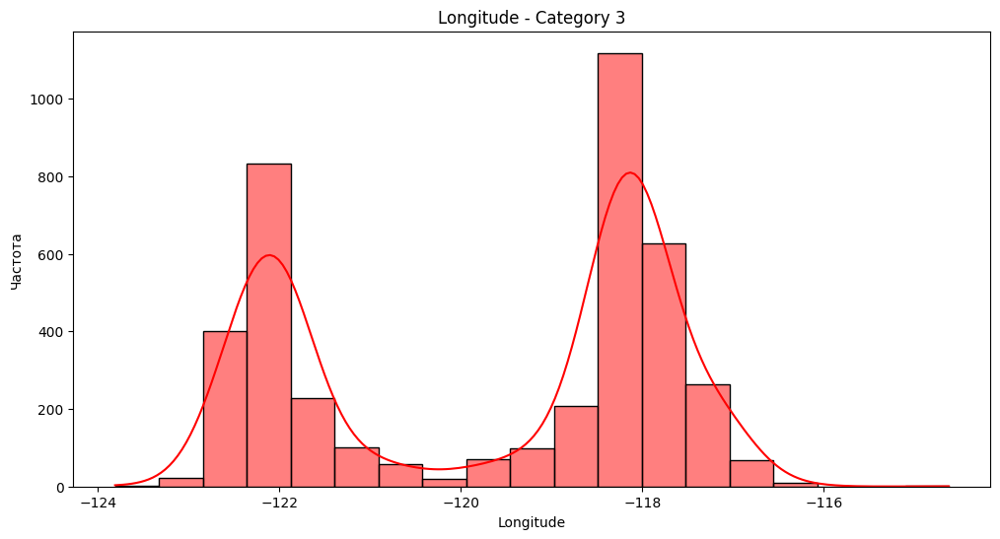

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


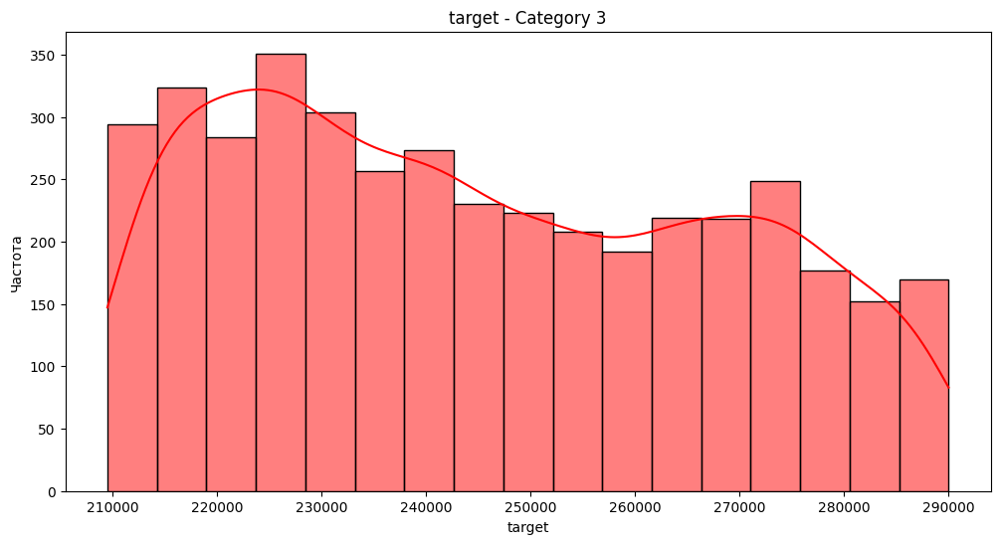

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


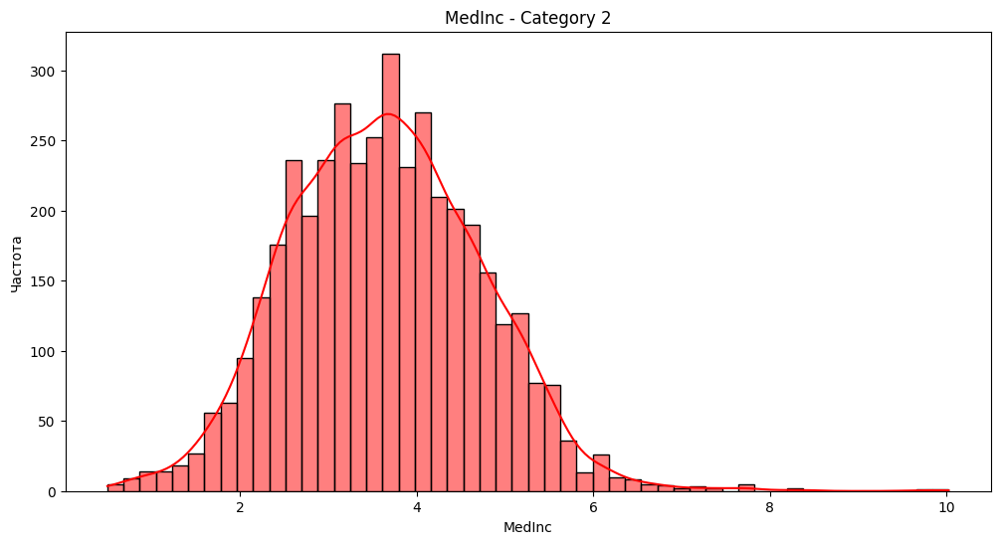

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


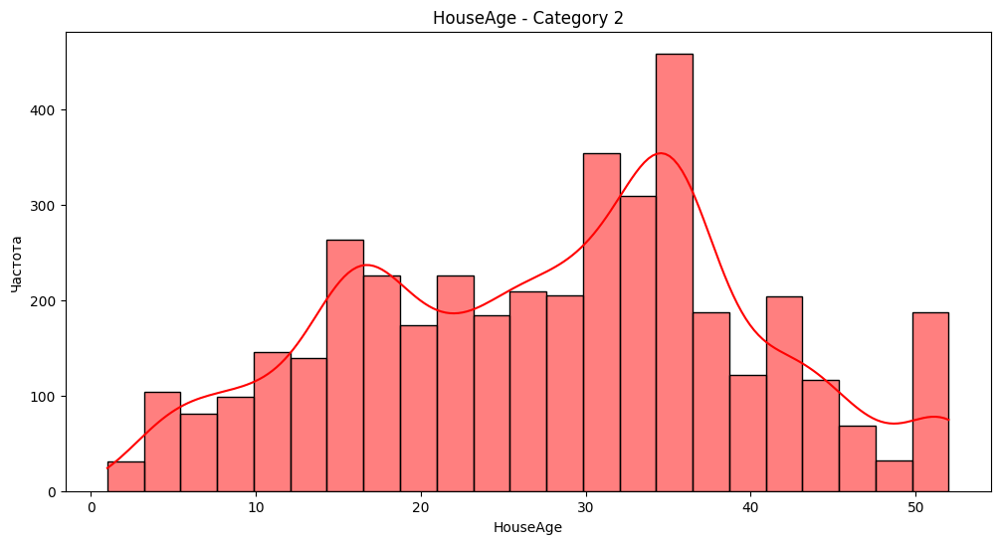

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


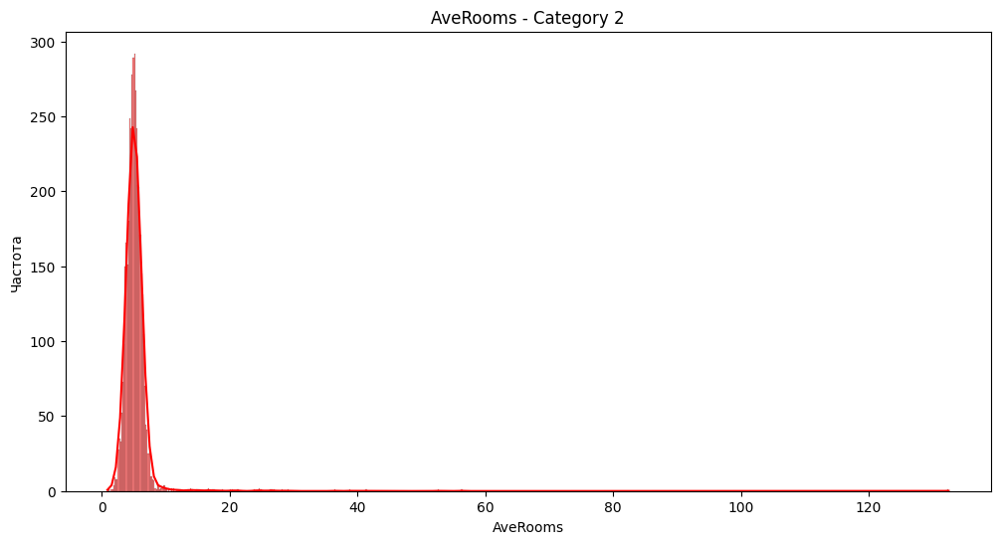

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


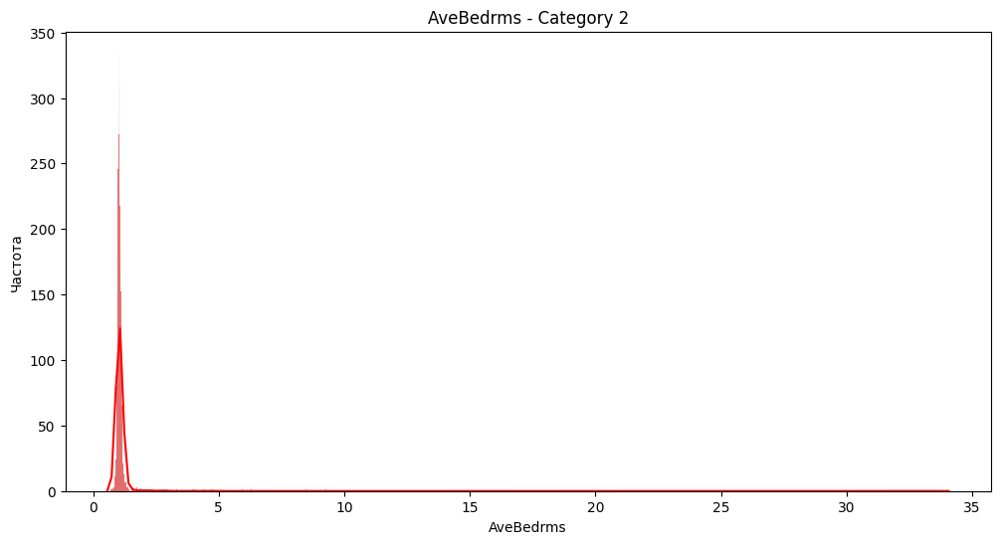

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


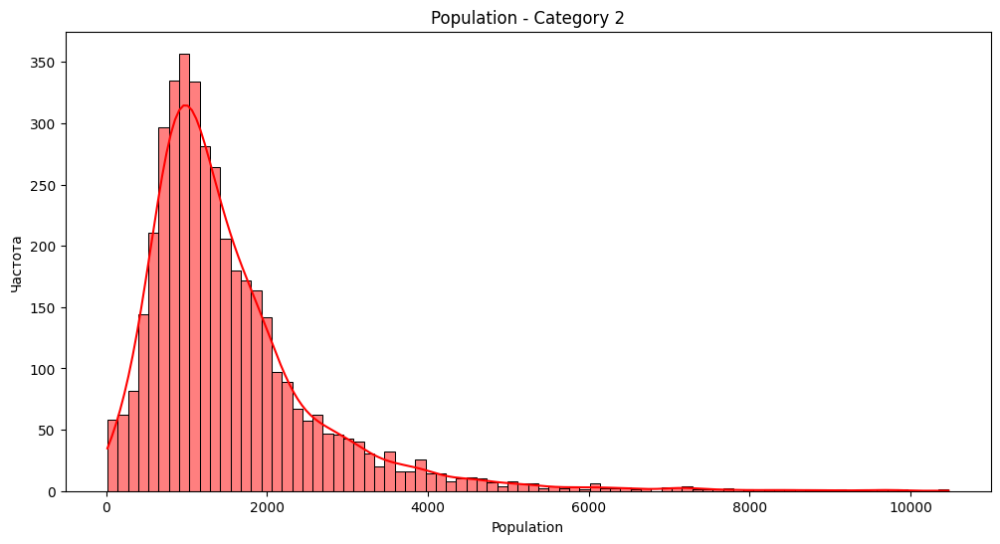

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


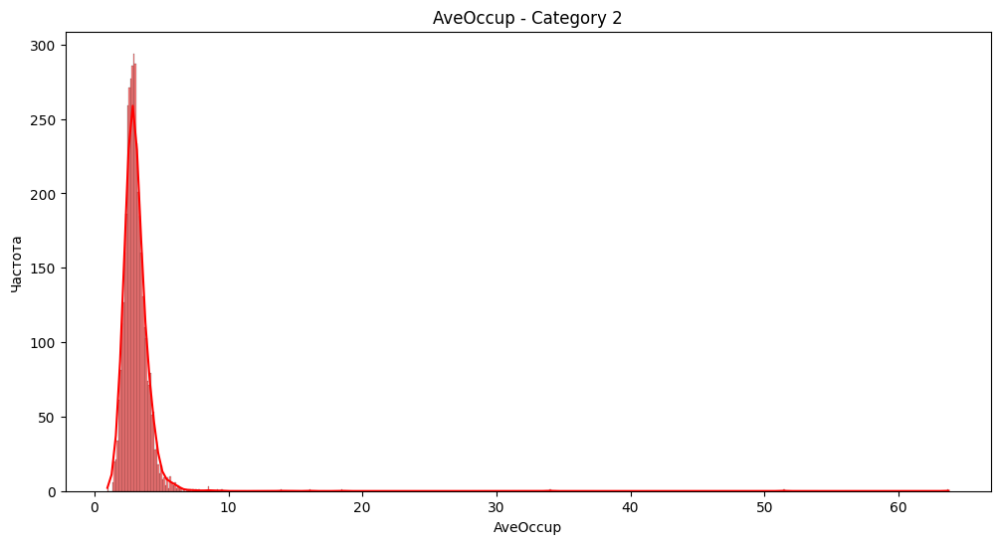

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


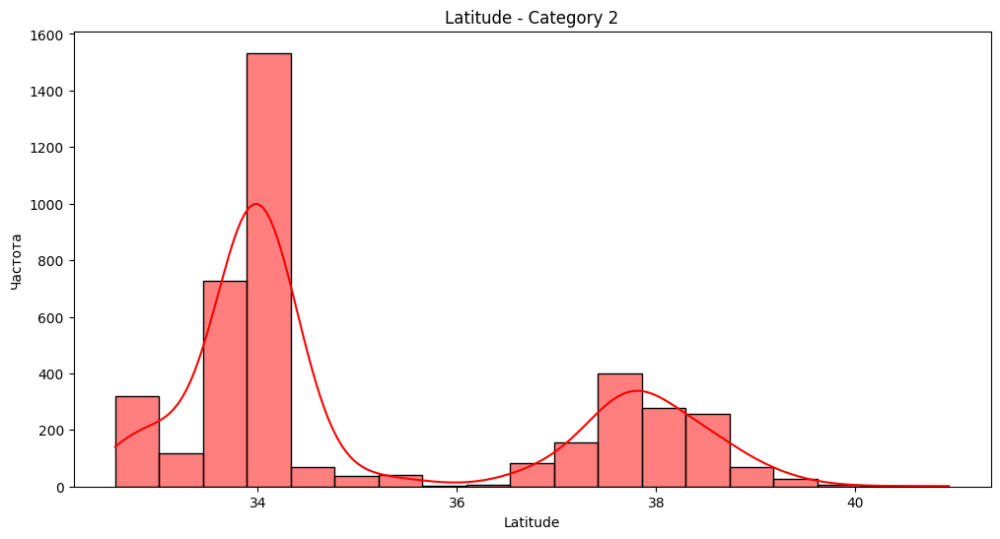

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


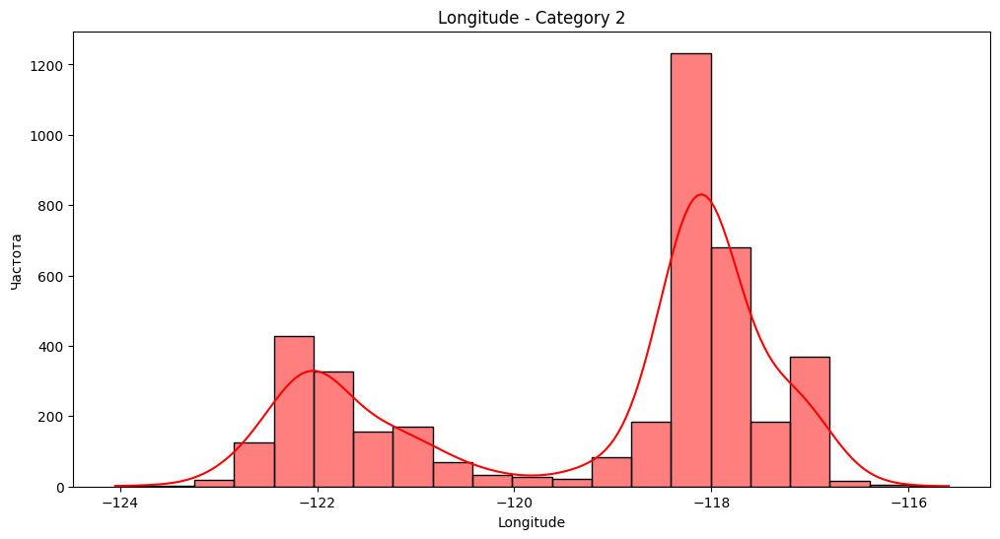

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


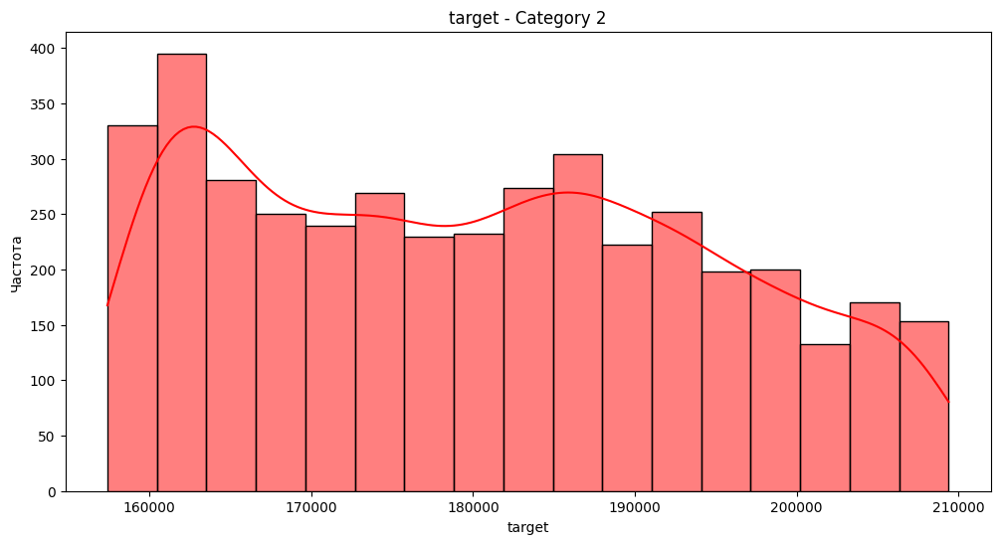

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


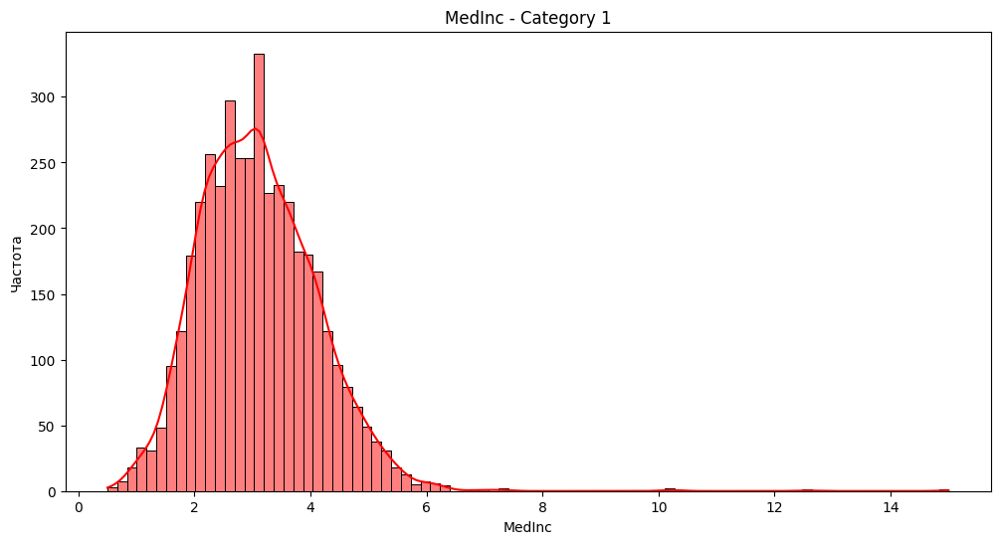

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


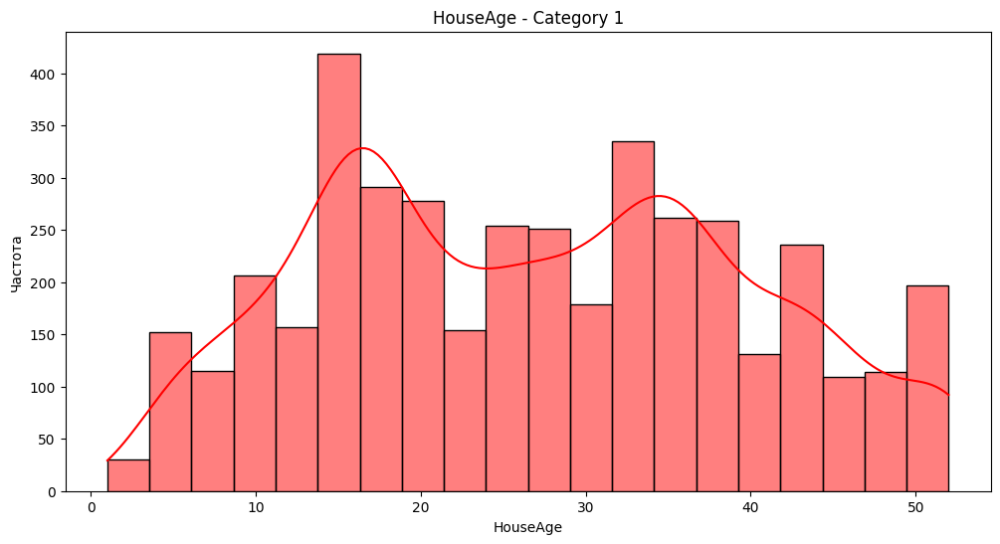

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


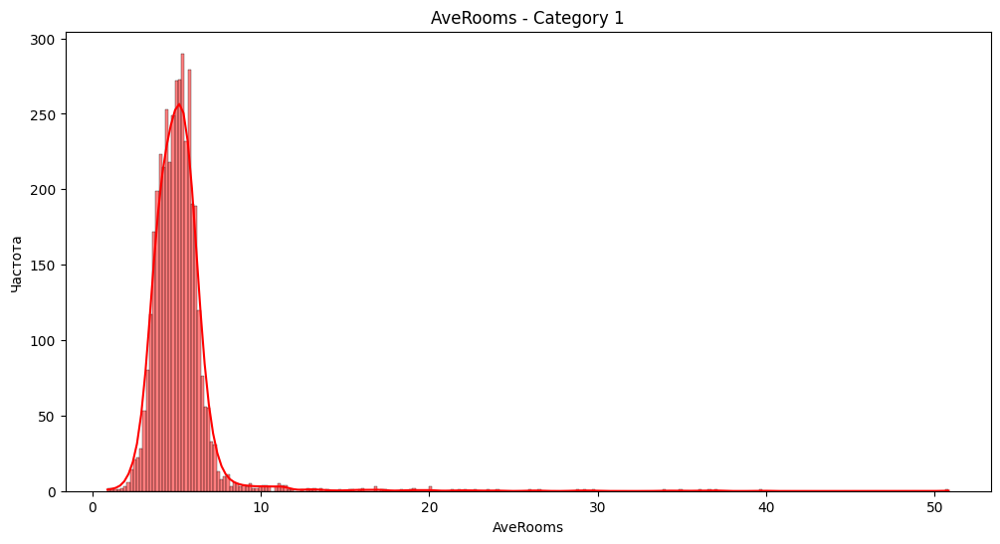

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


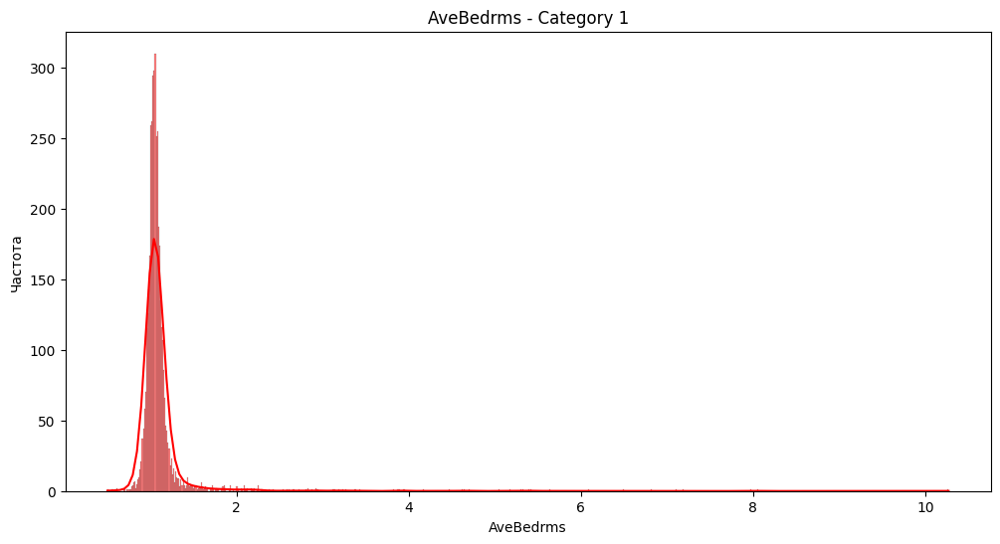

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


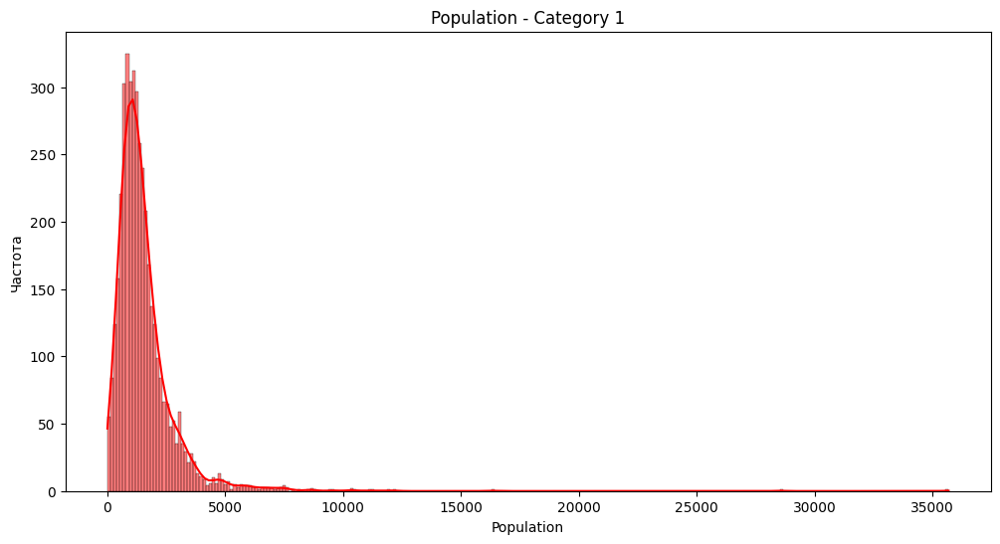

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


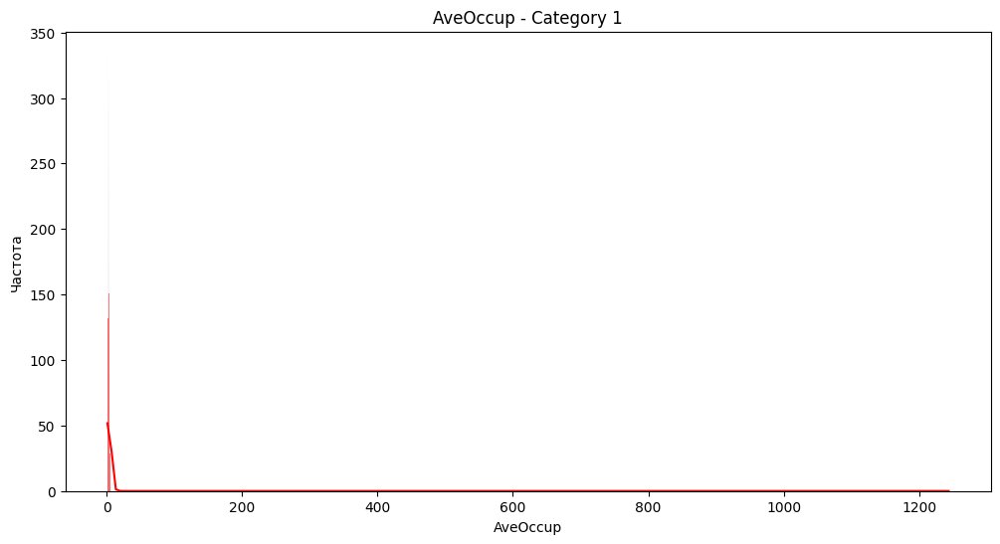

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


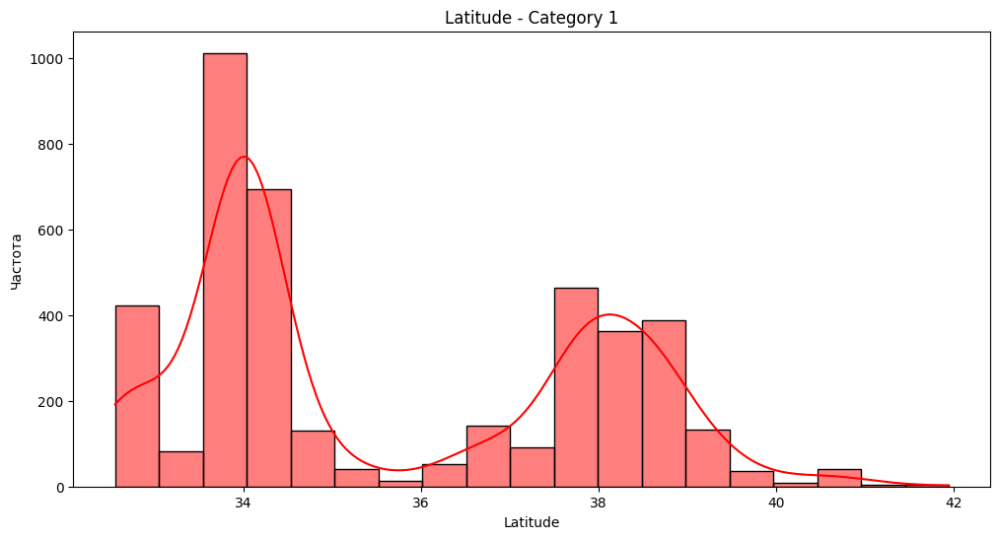

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


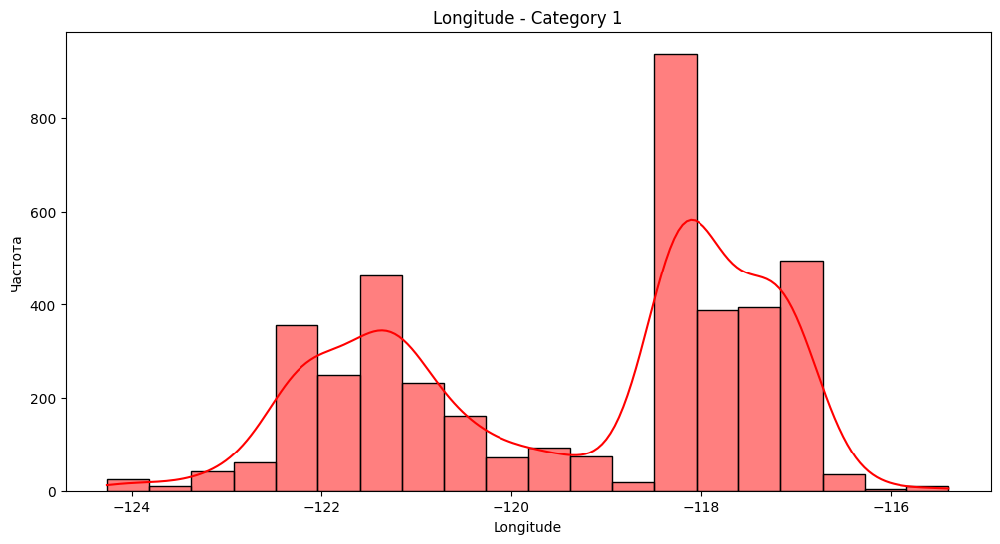

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


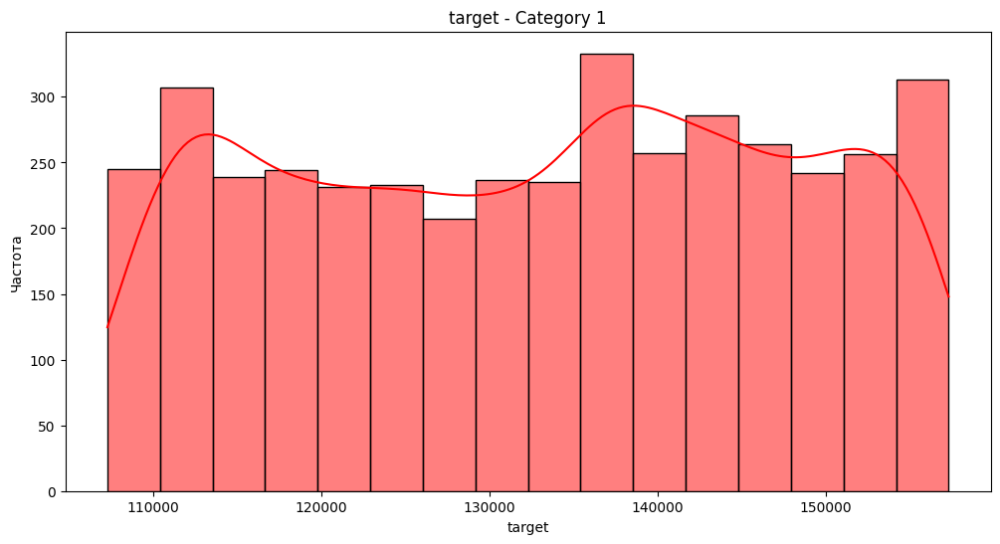

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


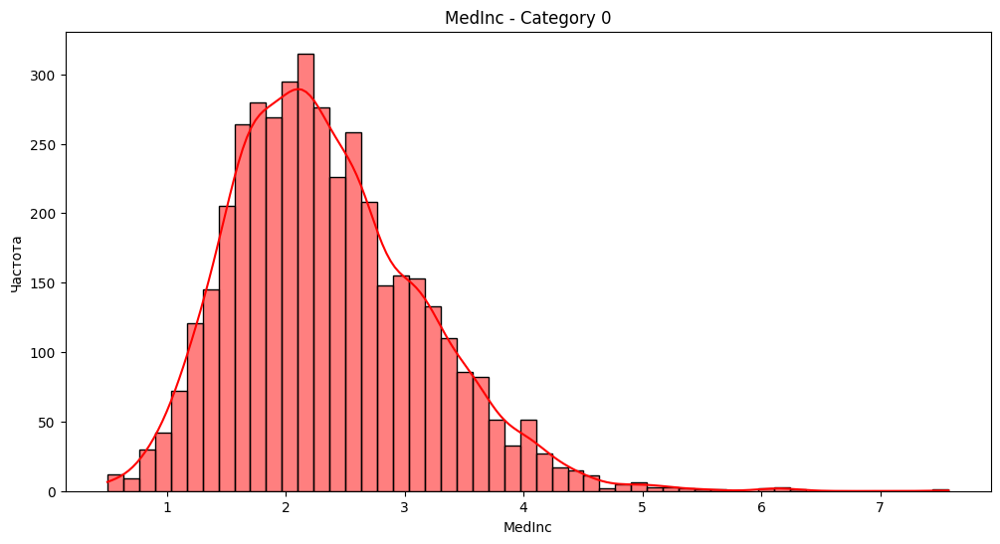

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


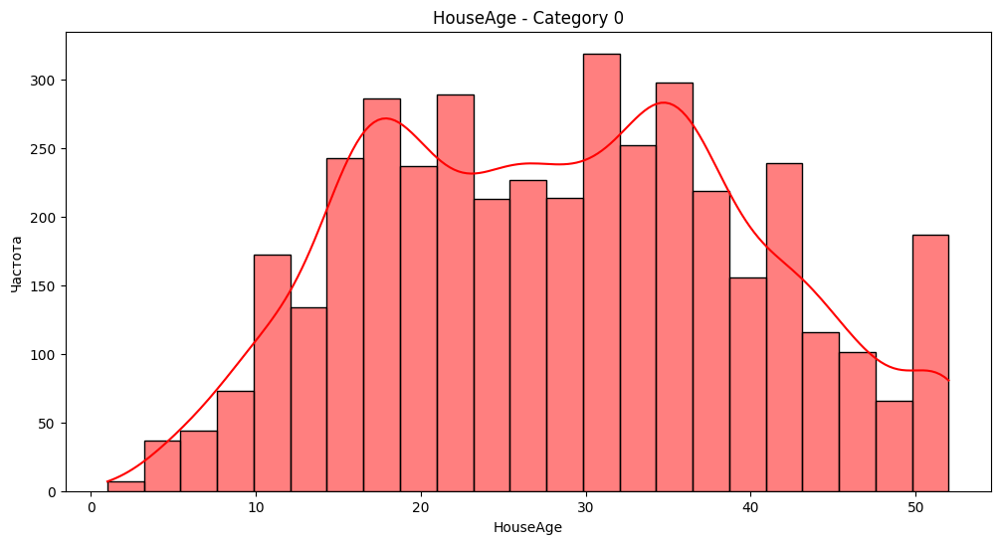

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


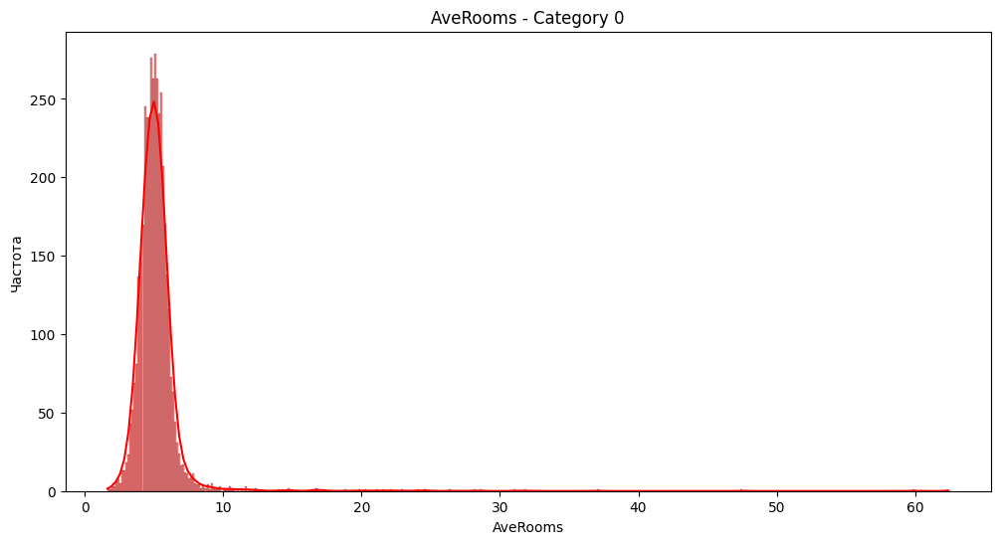

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


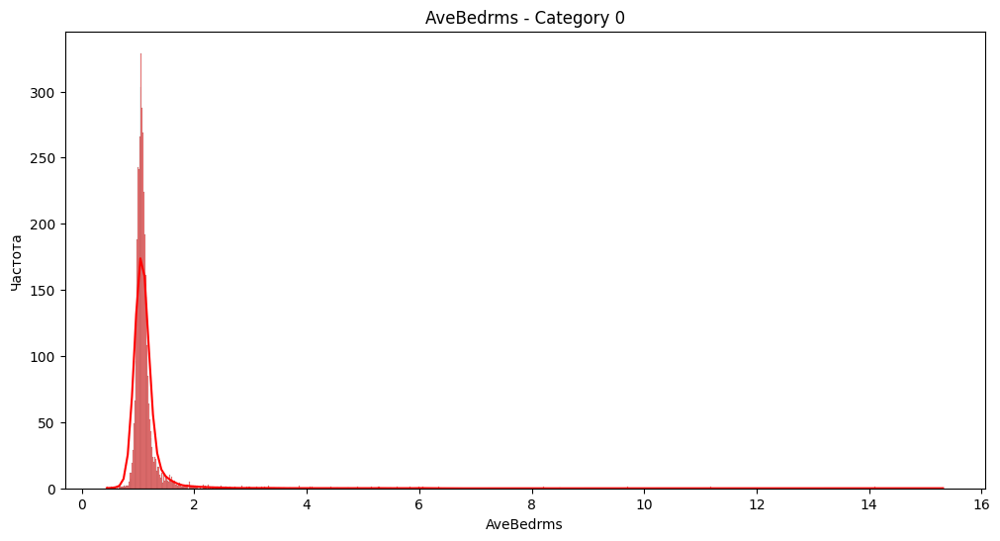

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


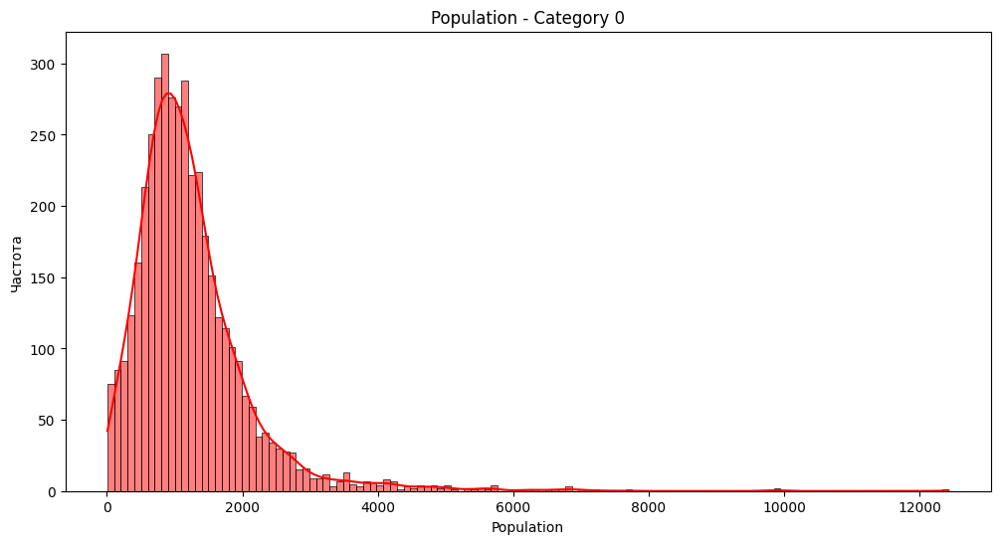

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


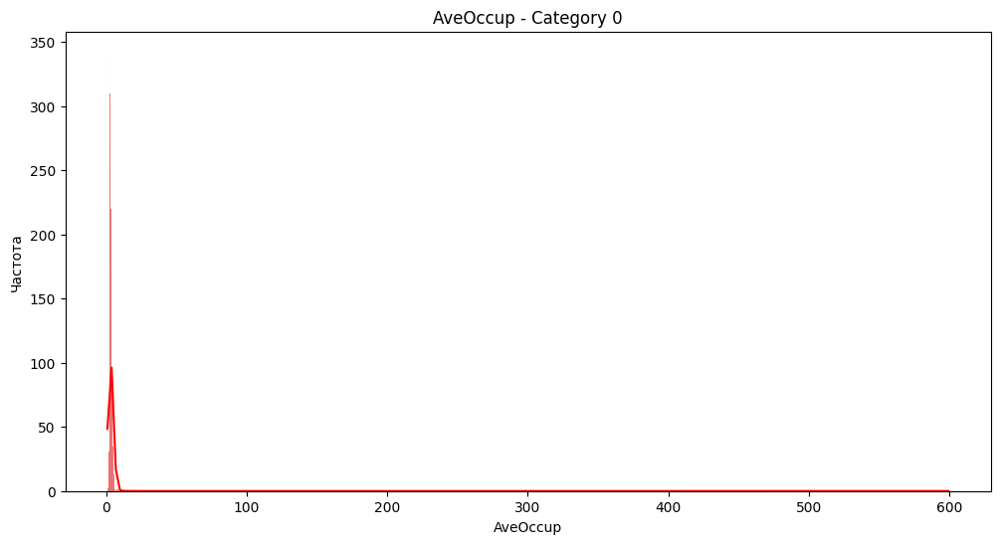

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


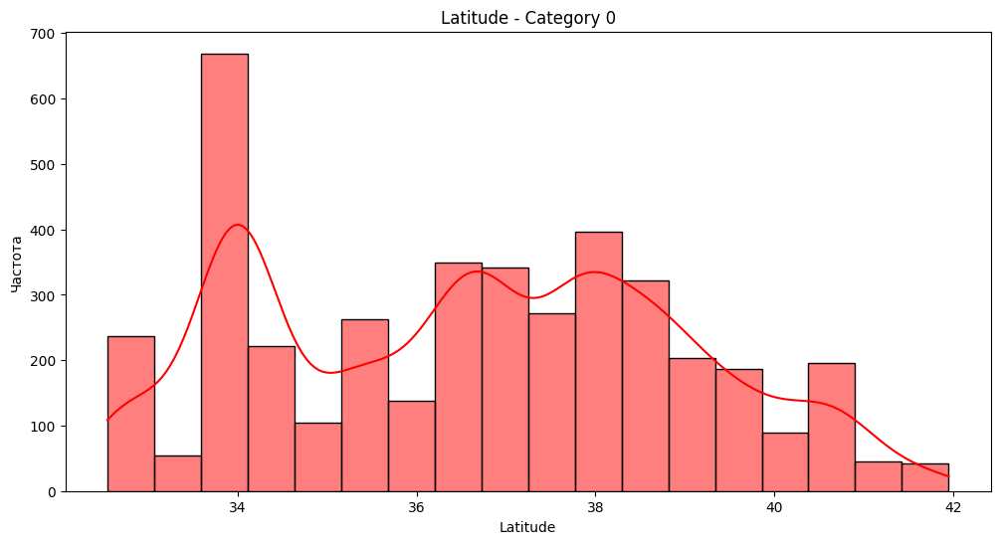

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


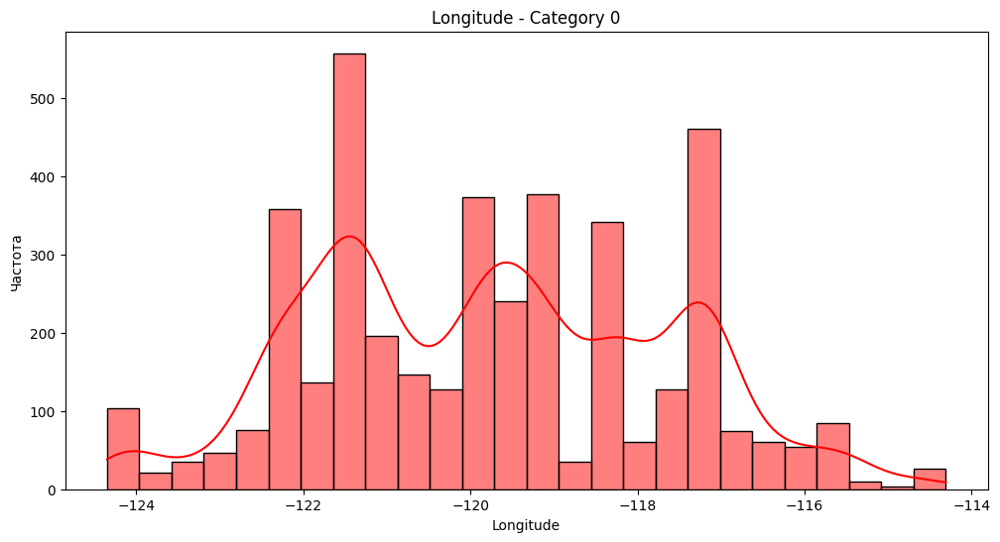

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


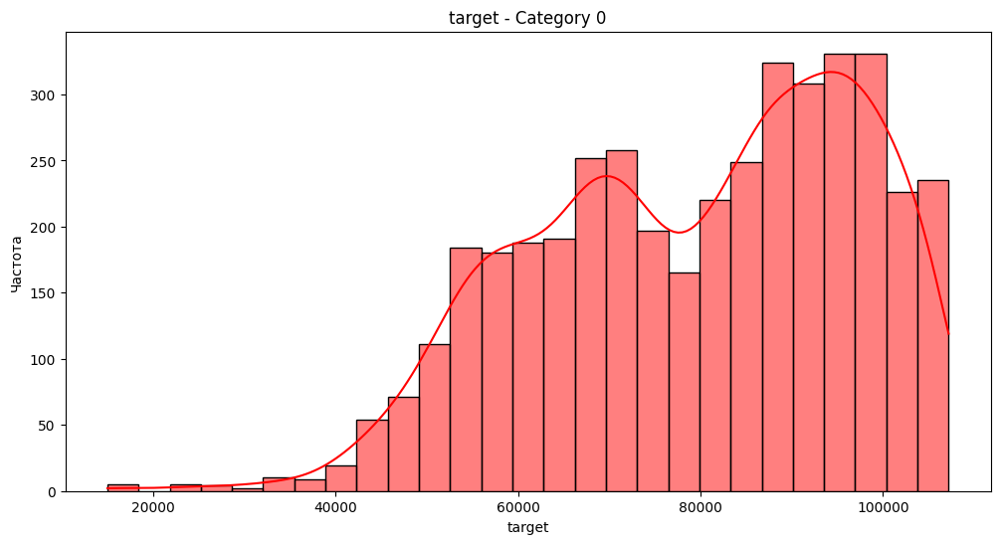

In [13]:
data['category'] = pd.qcut(data['target'], 5, labels=False)

# Построение графиков
for category in data['category'].unique():
    subset = data[data['category'] == category]
    for column in subset.columns:
        if column != 'category':  # Исключаем столбец 'category'
            plt.figure(figsize=(12, 6))
            sns.histplot(subset[column], color='red', kde=True)
            plt.title(f'{column} - Category {category}')
            plt.xlabel(column)
            plt.ylabel('Частота')
            plt.show()

Графики, конечно, красивые, но по факту в Калифорнии по ценовым категориям не настолько критичные отличия, судя по гистограммам

In [14]:
data

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target,category
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,452600.0,4
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,358500.0,4
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,352100.0,4
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,341300.0,4
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,342200.0,4
...,...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,78100.0,0
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,77100.0,0
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,92300.0,0
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,84700.0,0


Данные корректные, проблемы с распределением в некоторых фичах, в целом данные красивые

Построим матрицу корреляции и графики созависимости величин

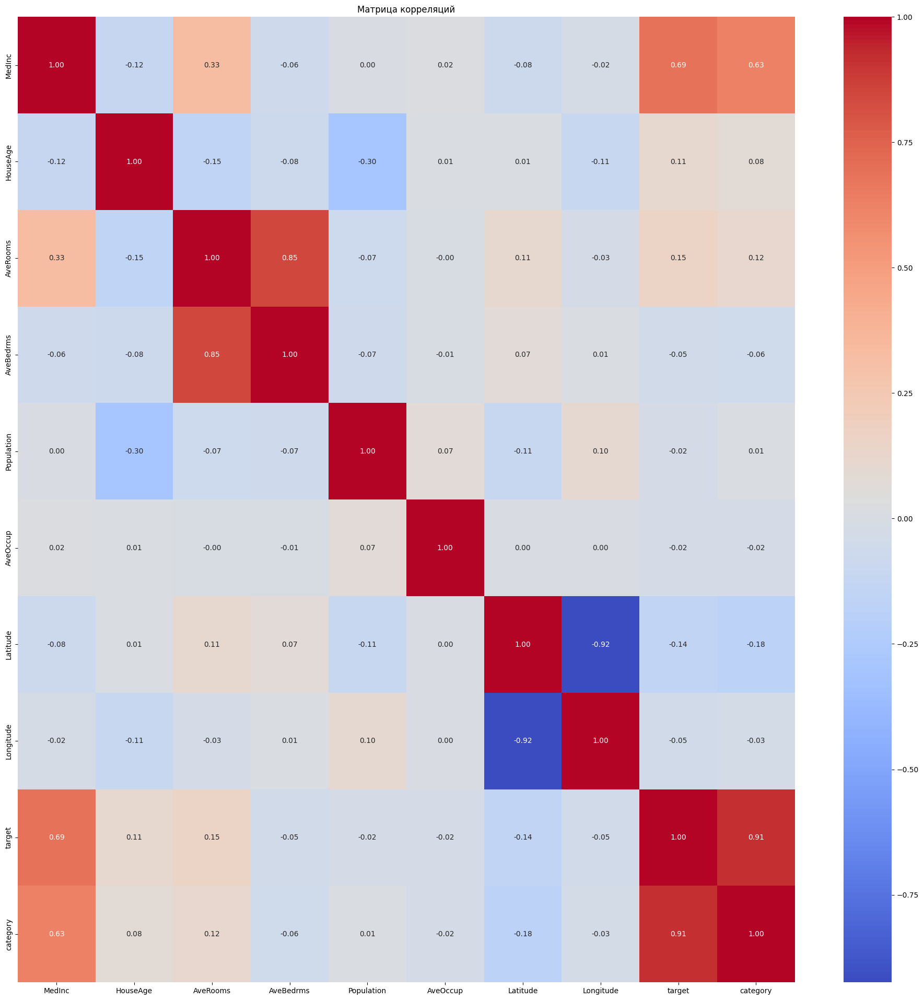

In [15]:
plt.figure(figsize=(24, 24))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Матрица корреляций')
plt.show()

В этом датасете есть несколько очень информативных фичей и фичей с почти 0 корреляцией, это может значить одно: нужен будет крутой feature engineering

In [16]:
def plot_with_moving_average(df, feature, window_size=10):
    plt.figure(figsize=(16, 8))
    sns.scatterplot(x=feature, y='target', data=df)
    
    df_sorted = df.sort_values(by=feature)
    rolling_mean = df_sorted['target'].rolling(window=window_size).mean()
    
    plt.plot(df_sorted[feature], rolling_mean, color='red', label=f'Скользящее среднее')
    plt.title(f'Корреляция {feature} со стоимостью домов')
    plt.xlabel(feature)
    plt.ylabel('Стоимость домов')
    plt.legend()
    plt.show()

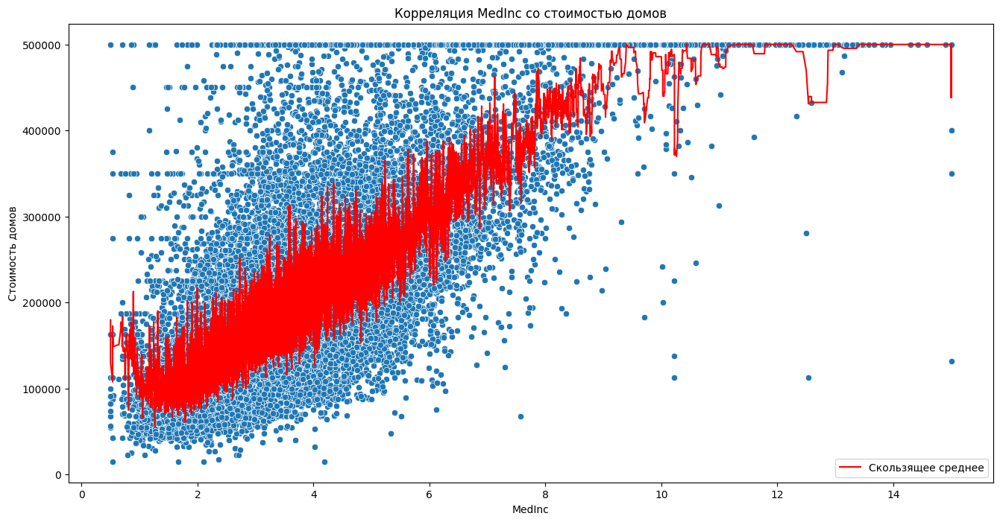

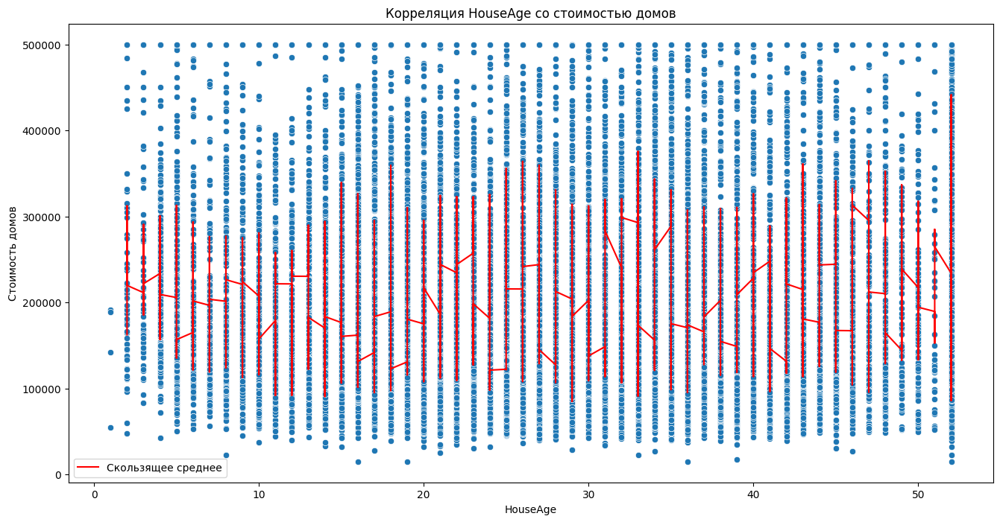

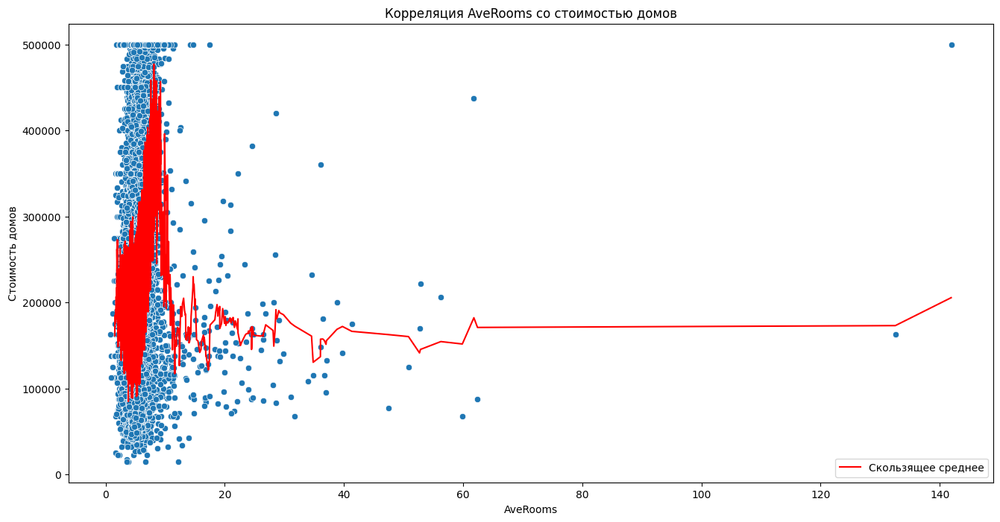

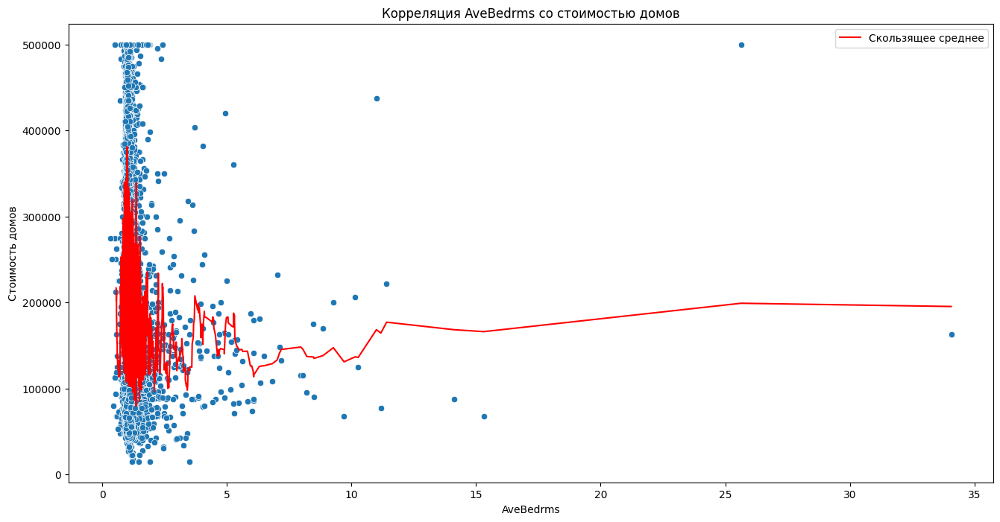

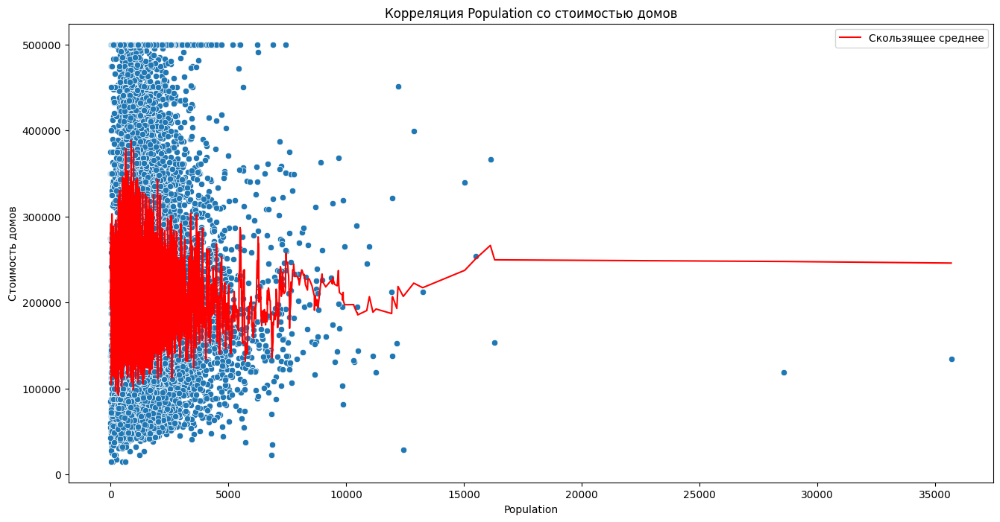

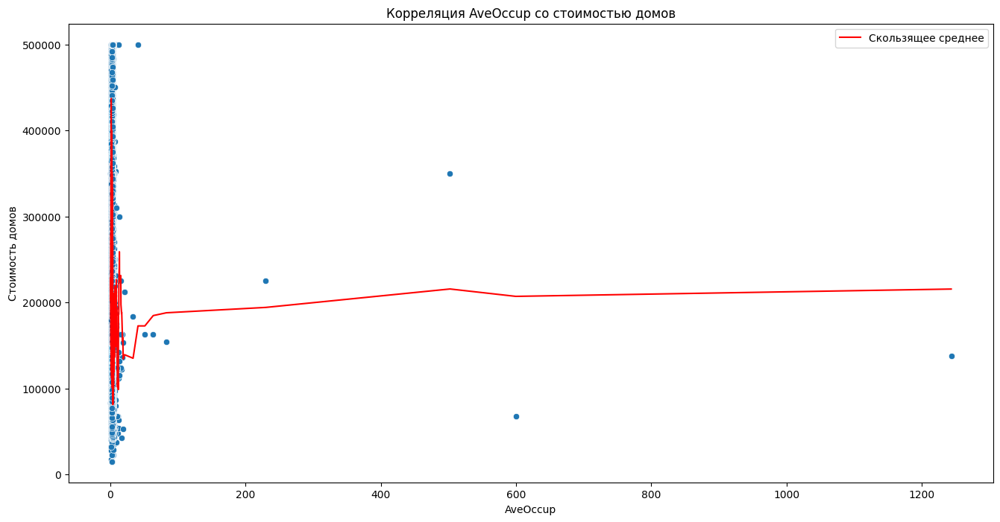

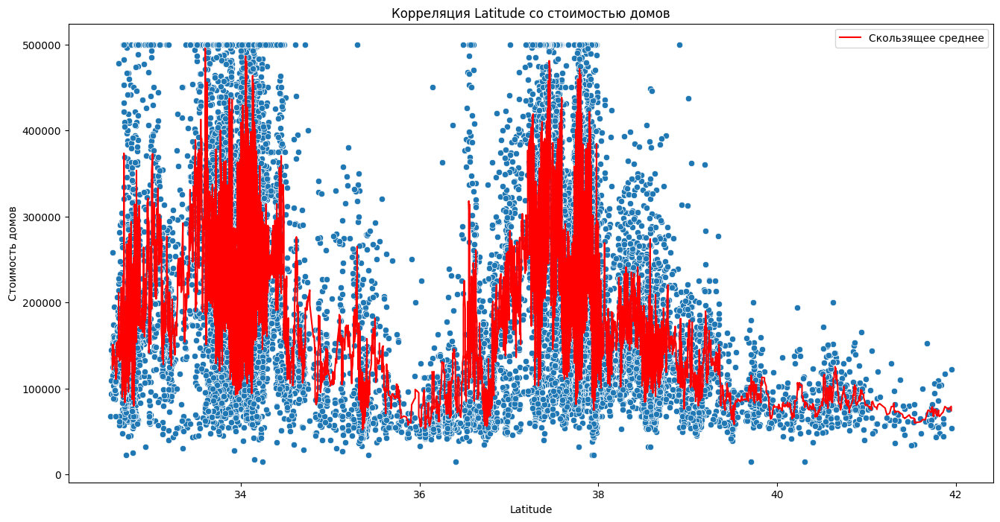

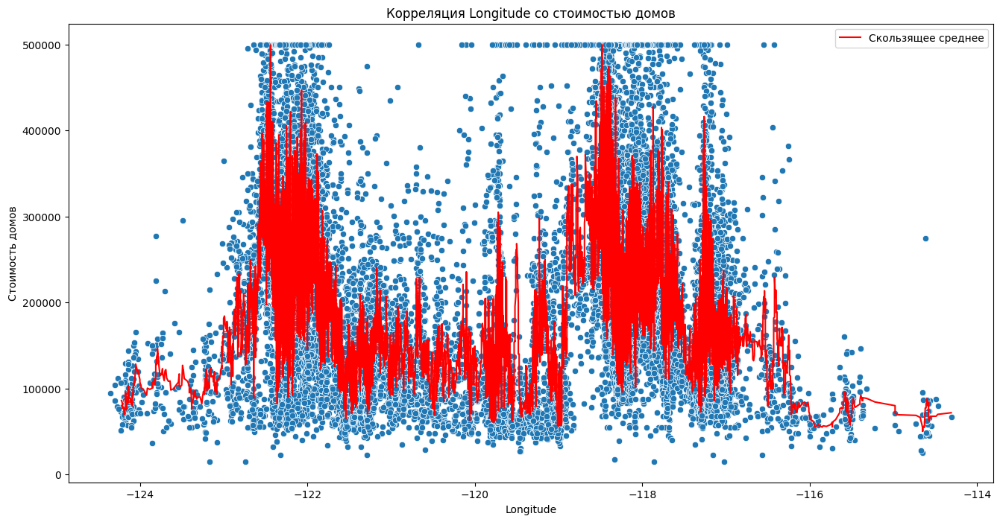

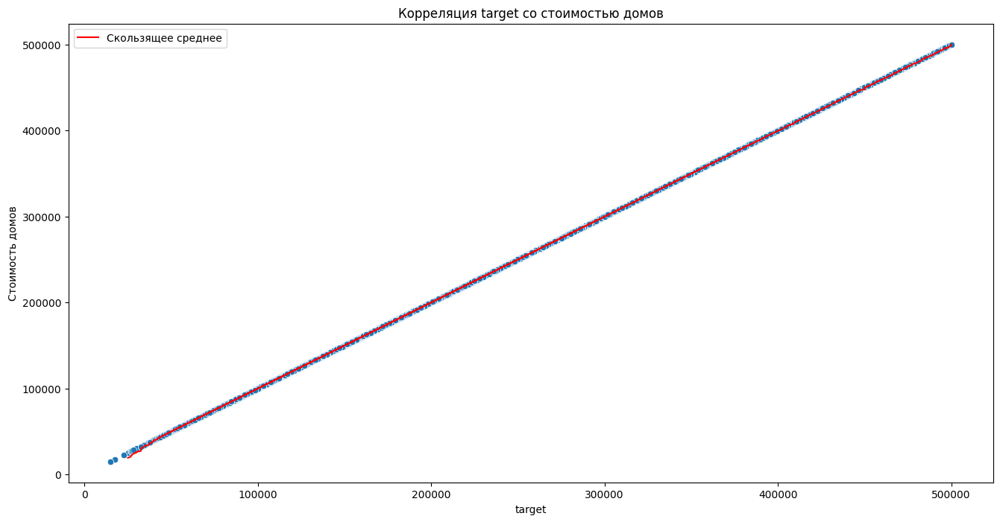

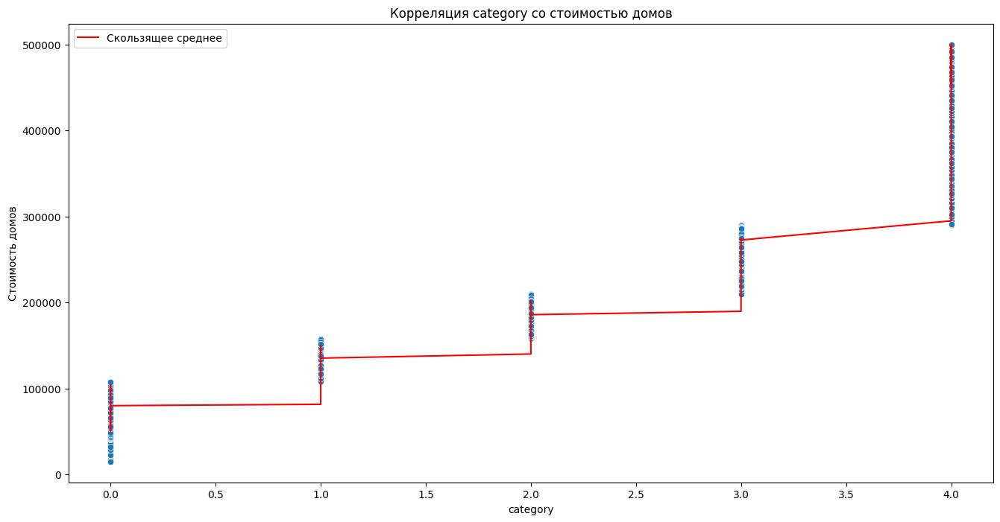

In [17]:
for feature in data.columns:
    plot_with_moving_average(data, feature)

Из графиков видна очень интересная зависимость медианной стоимости от долготы и широты, пришло время подрубить геоданные

In [18]:
import folium
from IPython.display import display

def get_color(price):
    if price < 1*100_000:
        return 'green'
    elif price < 2*100_000:
        return 'blue'
    elif price < 3*100_000:
        return 'orange'
    else:
        return 'red'

data_sample = data.sample(n=4000, random_state=42)

m = folium.Map(location=[data_sample['Latitude'].mean(), data_sample['Longitude'].mean()], zoom_start=6)

for _, row in data_sample.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        popup=f"Price: ${row['target']*100000:.2f}",
        color='crimson',
        fill=True,
        fill_color=get_color(row['target'])
    ).add_to(m)

display(m)

Хахахахахахаха, все ясно, имба-фича придумана: близость к океану, в среднем дома, которые ближе к океану, дороже

In [19]:
def classify_ocean_proximity(lat, lon):
    if lat > 33 and lat < 35 and lon > -118 and lon < -117:
        return 2
    elif lat >= 35 and lat < 37 and lon > -122 and lon < -121:
        return 1
    else:
        return 0

data['ocean_proximity'] = data.apply(lambda row: classify_ocean_proximity(row['Latitude'], row['Longitude']), axis=1)

In [20]:
data.loc[(data['ocean_proximity'] == 0)]

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target,category,ocean_proximity
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,452600.0,4,0
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,358500.0,4,0
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,352100.0,4,0
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,341300.0,4,0
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,342200.0,4,0
...,...,...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,78100.0,0,0
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,77100.0,0,0
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,92300.0,0,0
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,84700.0,0,0


# Попытка предсказать категорию для повышения точности модели

In [21]:
from sklearn.metrics import f1_score
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split

data_cat = data.copy()
data_cat = data_cat.drop(['target'], axis=1)

y_cat = data_cat['category']
X_cat = data_cat.drop('category', axis=1)

X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(X_cat, y_cat, test_size = 0.2)
cat_category = CatBoostClassifier(iterations=1_000, depth=12, learning_rate=0.05)
cat_category.fit(X_train_cat, y_train_cat, verbose=100)

0:	learn: 1.5684682	total: 613ms	remaining: 10m 12s
100:	learn: 0.7593169	total: 45.4s	remaining: 6m 44s
200:	learn: 0.6107221	total: 1m 30s	remaining: 5m 58s
300:	learn: 0.5119455	total: 2m 15s	remaining: 5m 14s
400:	learn: 0.4366250	total: 3m	remaining: 4m 30s
500:	learn: 0.3769615	total: 3m 45s	remaining: 3m 44s
600:	learn: 0.3284168	total: 4m 31s	remaining: 3m
700:	learn: 0.2891951	total: 5m 16s	remaining: 2m 14s
800:	learn: 0.2553084	total: 6m 1s	remaining: 1m 29s
900:	learn: 0.2280058	total: 6m 47s	remaining: 44.7s
999:	learn: 0.2048110	total: 7m 31s	remaining: 0us


In [22]:
preds = cat_category.predict(X_test_cat)
f1_score(y_test_cat, preds, average='macro')

0.678027855020042

# Feature Engineering

In [23]:
data = data.drop(['category'], axis=1)

In [24]:
data.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target,ocean_proximity
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,206855.816909,0.339729
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,115395.615874,0.741044
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,14999.000000,0.000000
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,119600.000000,0.000000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,179700.000000,0.000000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,264725.000000,0.000000
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,500001.000000,2.000000


In [25]:
data['bedrooms_per_rooms'] = data['AveRooms'] / data['AveBedrms']
data['condition'] = (100 - data['HouseAge']*1.9)/100

In [26]:
data['dollar_per_occupied'] = data['MedInc'] / data['AveOccup']
data['bedrooms_per_occup'] = data['AveOccup'] / data['AveBedrms']
data['percent_occupied'] = data['AveOccup']*100 / data['Population']

In [27]:
import math

def haversine(lat1, lon1, lat2, lon2):
    # Радиус Земли в километрах
    R = 6371.0
    
    # Преобразование градусов в радианы
    lat1_rad = math.radians(lat1)
    lon1_rad = math.radians(lon1)
    lat2_rad = math.radians(lat2)
    lon2_rad = math.radians(lon2)
    
    # Разница координат
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad
    
    # Формула Haversine
    a = math.sin(dlat / 2)**2 + math.cos(lat1_rad) * math.cos(lat2_rad) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    
    # Расстояние в километрах
    distance = R * c
    return distance

beverly_hills_lat = 34.0736
beverly_hills_lon = -118.4004

data['Distance_to_Beverly_Hills'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], beverly_hills_lat, beverly_hills_lon), axis=1
)

rancho_palos_verdes_lat = 33.7454
rancho_palos_verdes_lon = -118.4047

data['Distance_to_Rancho_Palos_Verdes'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], rancho_palos_verdes_lat, rancho_palos_verdes_lon), axis=1
)

north_island_lat = 32.7157
north_island_lon = -117.1611

data['Distance_to_North_Island'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], north_island_lat, north_island_lon), axis=1
)

# Добавление остальных городов
los_angeles_lat = 34.052
los_angeles_lon = -118.244

data['Distance_to_Los_Angeles'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], los_angeles_lat, los_angeles_lon), axis=1
)

san_diego_lat = 32.716
san_diego_lon = -117.165

data['Distance_to_San_Diego'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], san_diego_lat, san_diego_lon), axis=1
)

san_jose_lat = 37.339
san_jose_lon = -121.895

data['Distance_to_San_Jose'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], san_jose_lat, san_jose_lon), axis=1
)

san_francisco_lat = 37.775
san_francisco_lon = -122.419

data['Distance_to_San_Francisco'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], san_francisco_lat, san_francisco_lon), axis=1
)

fresno_lat = 36.748
fresno_lon = -119.772

data['Distance_to_Fresno'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], fresno_lat, fresno_lon), axis=1
)

sacramento_lat = 38.582
sacramento_lon = -121.494

data['Distance_to_Sacramento'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], sacramento_lat, sacramento_lon), axis=1
)

long_beach_lat = 33.767
long_beach_lon = -118.189

data['Distance_to_Long_Beach'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], long_beach_lat, long_beach_lon), axis=1
)

oakland_lat = 37.804
oakland_lon = -122.271

data['Distance_to_Oakland'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], oakland_lat, oakland_lon), axis=1
)

bakersfield_lat = 35.373
bakersfield_lon = -119.019

data['Distance_to_Bakersfield'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], bakersfield_lat, bakersfield_lon), axis=1
)

anaheim_lat = 33.835
anaheim_lon = -117.915

data['Distance_to_Anaheim'] = data.apply(
    lambda row: haversine(row['Latitude'], row['Longitude'], anaheim_lat, anaheim_lon), axis=1
)

cities = {
    'Los_Angeles': (34.052, -118.244),
    'San_Diego': (32.716, -117.165),
    'San_Jose': (37.339, -121.895),
    'San_Francisco': (37.775, -122.419),
    'Fresno': (36.748, -119.772),
    'Sacramento': (38.582, -121.494),
    'Long_Beach': (33.767, -118.189),
    'Oakland': (37.804, -122.271),
    'Bakersfield': (35.373, -119.019),
    'Anaheim': (33.835, -117.915)
}

def is_near_large_city(lat, lon, threshold=10):
    for city, (city_lat, city_lon) in cities.items():
        if haversine(lat, lon, city_lat, city_lon) < threshold:
            return 1
    return 0

data['Is_Near_Large_City'] = data.apply(
    lambda row: is_near_large_city(row['Latitude'], row['Longitude']), axis=1
)

In [28]:
# Отдеально для лос анджелеса
def add_features(data):
    # Расстояние до центра ближайшего крупного города
    data['Distance_to_Nearest_City'] = data.apply(
        lambda row: min(haversine(row['Latitude'], row['Longitude'], city_lat, city_lon) for city_lat, city_lon in cities.values()), axis=1
    )
    
    # Пример координат побережья (Лос-Анджелес)
    coast_lat = 34.052
    coast_lon = -118.244
    data['Distance_to_Coast'] = data.apply(
        lambda row: haversine(row['Latitude'], row['Longitude'], coast_lat, coast_lon), axis=1
    )
    
    # Пример расстояния до транспортных узлов (Лос-Анджелес)
    airport_lat = 33.9416
    airport_lon = -118.4085
    data['Distance_to_Airport'] = data.apply(
        lambda row: haversine(row['Latitude'], row['Longitude'], airport_lat, airport_lon), axis=1
    )
    
    # Пример расстояния до школ (Лос-Анджелес)
    school_lat = 34.0689
    school_lon = -118.4452
    data['Distance_to_School'] = data.apply(
        lambda row: haversine(row['Latitude'], row['Longitude'], school_lat, school_lon), axis=1
    )
    
    # Пример расстояния до парков (Лос-Анджелес)
    park_lat = 34.0522
    park_lon = -118.2437
    data['Distance_to_Park'] = data.apply(
        lambda row: haversine(row['Latitude'], row['Longitude'], park_lat, park_lon), axis=1
    )
    
    # Пример расстояния до торговых центров (Лос-Анджелес)
    mall_lat = 34.0736
    mall_lon = -118.4004
    data['Distance_to_Mall'] = data.apply(
        lambda row: haversine(row['Latitude'], row['Longitude'], mall_lat, mall_lon), axis=1
    )
    
    return data

# Добавление всех признаков
data = add_features(data)

In [29]:
data = data.drop(['ocean_proximity'], axis=1)

In [30]:
data

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target,bedrooms_per_rooms,...,Distance_to_Oakland,Distance_to_Bakersfield,Distance_to_Anaheim,Is_Near_Large_City,Distance_to_Nearest_City,Distance_to_Coast,Distance_to_Airport,Distance_to_School,Distance_to_Park,Distance_to_Mall
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,452600.0,6.821705,...,9.185757,399.719744,594.424433,1,9.185757,556.531107,556.863783,543.561202,556.531199,545.681537
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,358500.0,6.418626,...,7.670446,397.557981,592.186859,1,7.670446,554.281742,554.587323,541.292753,554.281885,543.418114
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,352100.0,7.721053,...,5.794479,398.085500,592.546537,1,5.794479,554.612463,554.845578,541.573398,554.612739,543.712326
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,341300.0,5.421277,...,5.437346,398.730187,593.139141,1,5.437346,555.195966,555.405632,542.140800,555.196283,544.284122
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,342200.0,5.810714,...,5.437346,398.730187,593.139141,1,5.437346,555.195966,555.405632,542.140800,555.196283,544.284122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,78100.0,4.451872,...,212.718951,491.891746,688.501286,0,105.774767,654.543510,660.510992,646.067853,654.533211,647.042129
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,77100.0,4.646667,...,208.889799,496.942684,693.961606,0,103.901769,659.759888,665.472470,651.055580,659.750053,652.086317
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,92300.0,4.647423,...,202.548174,491.183933,688.354904,0,97.220008,654.054832,659.668677,645.262361,654.045183,646.314470
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,84700.0,4.547677,...,198.783635,494.742430,692.215850,0,95.484351,657.710185,663.101287,648.720911,657.700941,649.821815


In [31]:
data['avg_to_bogatstvo'] = (data['Distance_to_Beverly_Hills'] + data['Distance_to_Rancho_Palos_Verdes'] + data['Distance_to_North_Island'])/3
data['all_dollars'] = data['MedInc']*data['AveOccup']

In [32]:
data.loc[(data['Distance_to_North_Island'] < 100)]

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target,bedrooms_per_rooms,...,Distance_to_Anaheim,Is_Near_Large_City,Distance_to_Nearest_City,Distance_to_Coast,Distance_to_Airport,Distance_to_School,Distance_to_Park,Distance_to_Mall,avg_to_bogatstvo,all_dollars
10398,5.9339,15.0,6.361314,0.927007,943.0,3.441606,33.51,-117.64,286000.0,6.862205,...,44.199363,0,44.199363,82.148069,85.757435,96.948676,82.145507,94.154279,89.528001,20.422145
10399,7.2648,14.0,7.298913,0.951087,650.0,3.532609,33.51,-117.64,363200.0,7.674286,...,44.199363,0,44.199363,82.148069,85.757435,96.948676,82.145507,94.154279,89.528001,25.663696
10400,5.1360,15.0,9.466667,1.377778,133.0,2.955556,33.52,-117.55,447400.0,6.870968,...,48.657663,0,48.657663,87.251715,92.198004,102.801665,87.246365,99.820578,93.104475,15.179733
10418,4.0294,23.0,6.105747,1.183908,998.0,2.294253,33.42,-117.62,500001.0,5.157282,...,53.623182,0,53.623182,90.928393,93.203663,105.012438,90.927942,102.411403,90.945928,9.244463
10419,5.1482,12.0,6.781582,1.244392,2104.0,2.484061,33.38,-117.63,500001.0,5.449715,...,57.064230,0,57.064230,93.853784,95.346133,107.478595,93.854667,104.996030,91.101766,12.788445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15609,6.4745,8.0,8.052174,1.085217,2048.0,3.561739,32.73,-116.91,300300.0,7.419872,...,154.349999,0,23.905375,192.212774,193.721053,206.089540,192.211748,203.616796,135.414870,23.060480
15610,5.7652,13.0,6.497018,0.976143,1431.0,2.844930,32.72,-116.87,259900.0,6.655804,...,157.505450,0,27.601667,195.471923,197.178326,209.474767,195.470504,206.970213,138.964250,16.401593
15611,6.2578,9.0,7.325967,1.085635,1355.0,3.743094,32.67,-116.89,293100.0,6.748092,...,160.825673,0,26.237640,198.559333,199.760486,212.251538,198.558813,209.829254,140.172217,23.423533
15612,4.7367,14.0,5.937500,1.091570,2129.0,3.094477,32.74,-116.76,214500.0,5.439414,...,162.326793,0,37.978510,200.651029,203.224598,215.180194,200.647972,212.537956,146.535169,14.657608


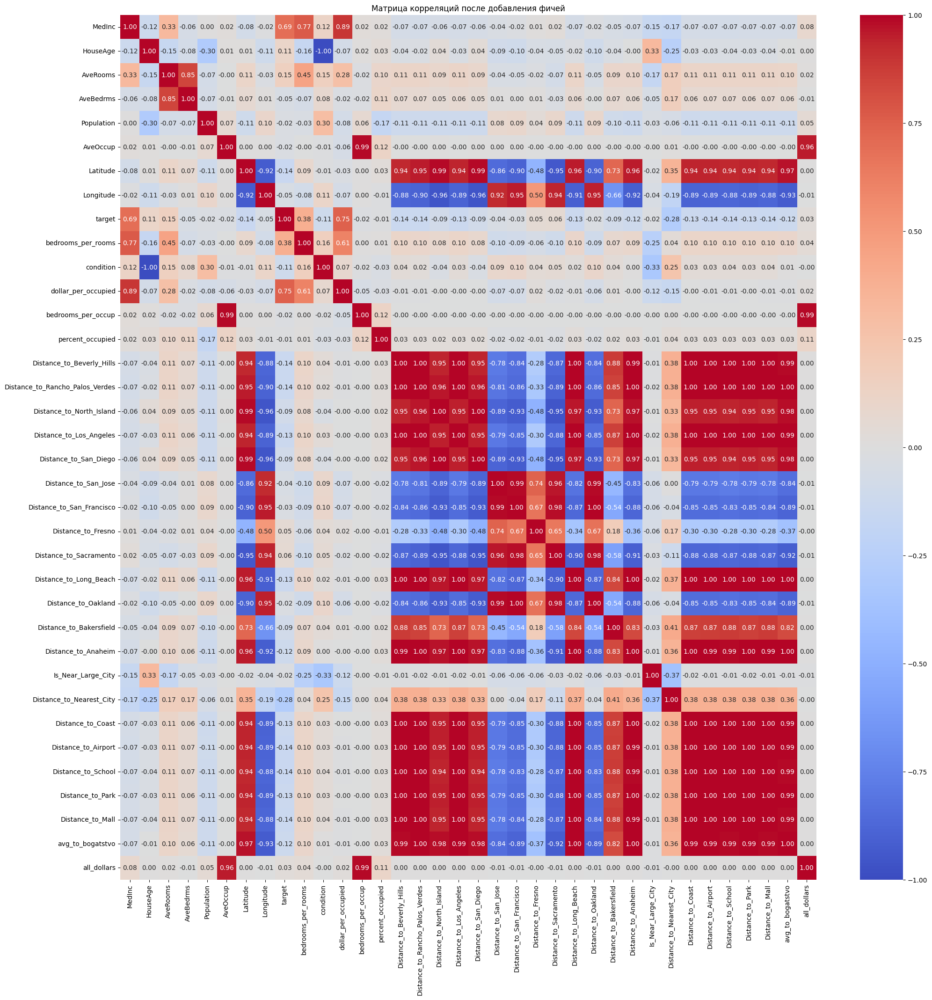

In [33]:
plt.figure(figsize=(24, 24))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Матрица корреляций после добавления фичей')
plt.show()

В целом неплохо, но можно лучше

# Machine Learning

In [34]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.model_selection import train_test_split

In [35]:
y = data['target']
X = data.drop('target', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [36]:
data_train = pd.concat([X_train, y_train], axis=1)

In [37]:
def add_noise(data, noise_level=0.01):
    noise = np.random.normal(0, noise_level, data.shape)
    return data + noise

for i in range(3):
    data_high_target = data_train[data_train['target'] >= 10_000]
    data_high_target_noisy = data_high_target.copy()

    for column in data_high_target_noisy.select_dtypes(include=['int']):
        data_high_target_noisy[column] = add_noise(data_high_target_noisy[column])
        data_high_target_noisy[column] = data_high_target_noisy[column].astype(int)

    data_train= pd.concat([data_train, data_high_target_noisy])

In [38]:
y_train = data_train['target']
X_train = data_train.drop(['target'], axis=1)

In [39]:
cat = CatBoostRegressor()
cat.fit(X_train, y_train, verbose=50)

Learning rate set to 0.088569
0:	learn: 109128.1725947	total: 29.1ms	remaining: 29s
50:	learn: 51353.1667604	total: 1.26s	remaining: 23.4s
100:	learn: 45851.0613201	total: 2.49s	remaining: 22.1s
150:	learn: 42783.1328954	total: 3.7s	remaining: 20.8s
200:	learn: 40365.2582366	total: 4.92s	remaining: 19.5s
250:	learn: 38526.1528439	total: 6.18s	remaining: 18.4s
300:	learn: 36900.4454679	total: 7.42s	remaining: 17.2s
350:	learn: 35469.7627739	total: 8.65s	remaining: 16s
400:	learn: 34207.9102901	total: 9.88s	remaining: 14.8s
450:	learn: 33034.7308636	total: 11.1s	remaining: 13.5s
500:	learn: 32049.5897079	total: 12.3s	remaining: 12.3s
550:	learn: 31070.6007252	total: 13.6s	remaining: 11.1s
600:	learn: 30261.1635153	total: 14.8s	remaining: 9.82s
650:	learn: 29426.5183393	total: 16.5s	remaining: 8.85s
700:	learn: 28686.9438718	total: 17.9s	remaining: 7.64s
750:	learn: 27993.8371392	total: 19.1s	remaining: 6.35s
800:	learn: 27325.1700093	total: 20.3s	remaining: 5.05s
850:	learn: 26651.006907

In [40]:
predictions = cat.predict(X_test)
sqrt(mean_squared_error(y_test, predictions))

41520.13075486196

44418

43617

43093

42900

42746

42555

41520

# Интерпретация результатов модели

In [41]:
from sklearn.metrics import r2_score
r2_score(y_test, predictions)

0.8684440288088505

86% осовения данных моделью

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


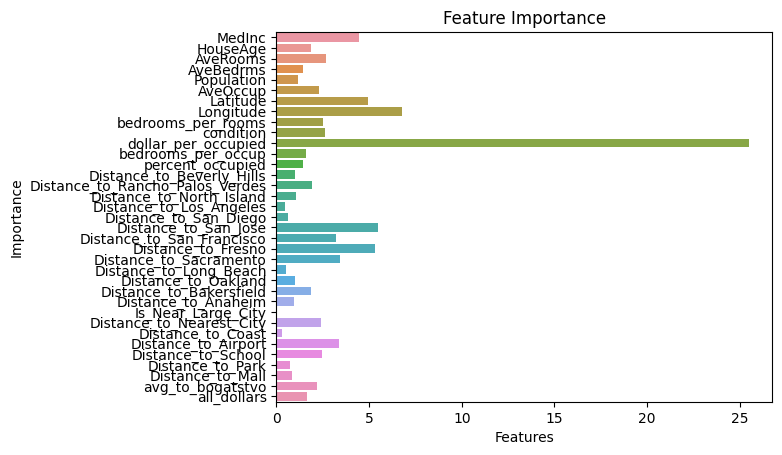

In [42]:
from catboost import Pool

feature_importances = cat.get_feature_importance(Pool(X_train, label=y_train))
feature_names = list(X_train.columns)

sns.barplot(x=feature_importances, y=feature_names)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.show()

- Добавить расстояние до крупных городов

- Добавить бинарный признак в крупном городе

- Нужно добавить больше признаков, связанных с долларами

In [43]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
def plot_predictions(y_test, y_pred):
    """
    Функция строит графики реальных и предсказанных значений, график остатков и выводит значения метрик.

    Параметры:
    y_test (array-like): 
        Реальные значения.
    y_pred (array-like):
        Предсказанные значения.
    """
    fig, axs = plt.subplots(4, 1, figsize=(10, 20))
    line = np.linspace(min(y_test), max(y_test), 1000)

    axs[0].scatter(y_test, y_test, color='blue')
    axs[0].plot(line, line, color='green', alpha=0.1)
    axs[0].set_title('Реальные значения')
    axs[0].set_xlabel('Реальные значения')
    axs[0].set_ylabel('Реальные значения')

    axs[1].scatter(y_test, y_pred, color='red')
    axs[1].plot(line, line, color='green', alpha=0.1)
    axs[1].set_title('Предсказанные значения')
    axs[1].set_xlabel('Реальные значения')
    axs[1].set_ylabel('Предсказанные значения')

    axs[2].scatter(y_test, y_test, color='blue', alpha=0.6, label='Реальные значения')
    axs[2].scatter(y_test, y_pred, color='red', alpha=0.6, label='Предсказанные значения')
    axs[2].plot(line, line, color='green', alpha=0.1)
    axs[2].set_title('Предсказанные значения наложенные на реальные значения')
    axs[2].set_xlabel('Реальные значения')
    axs[2].set_ylabel('Предсказанные значения')
    axs[2].legend()

    residuals = y_test - y_pred
    axs[3].scatter(y_test, residuals, color='purple')
    axs[3].axhline(y=0, color='green', alpha=0.1)
    axs[3].set_title('График остатков')
    axs[3].set_xlabel('Реальные значения')
    axs[3].set_ylabel('Остатки')

    plt.tight_layout()
    plt.show()

    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Средняя абсолютная ошибка (MAE): {mae:.4f}")
    print(f"Среднеквадратичная ошибка (MSE): {mse:.4f}")
    print(f"Коэффициент детерминации (R^2): {r2:.4f}")
    print(f"\nКорень из среднеквадратичной ошибки (RMSE): {rmse:.4f}")

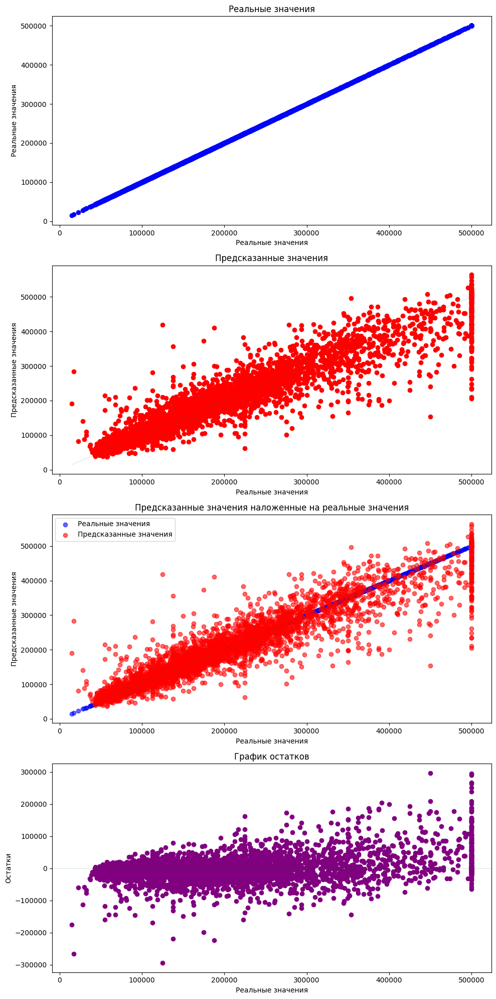

Средняя абсолютная ошибка (MAE): 26636.5458
Среднеквадратичная ошибка (MSE): 1723921257.9008
Коэффициент детерминации (R^2): 0.8684

Корень из среднеквадратичной ошибки (RMSE): 41520.1308


In [44]:
plot_predictions(y_test, predictions)

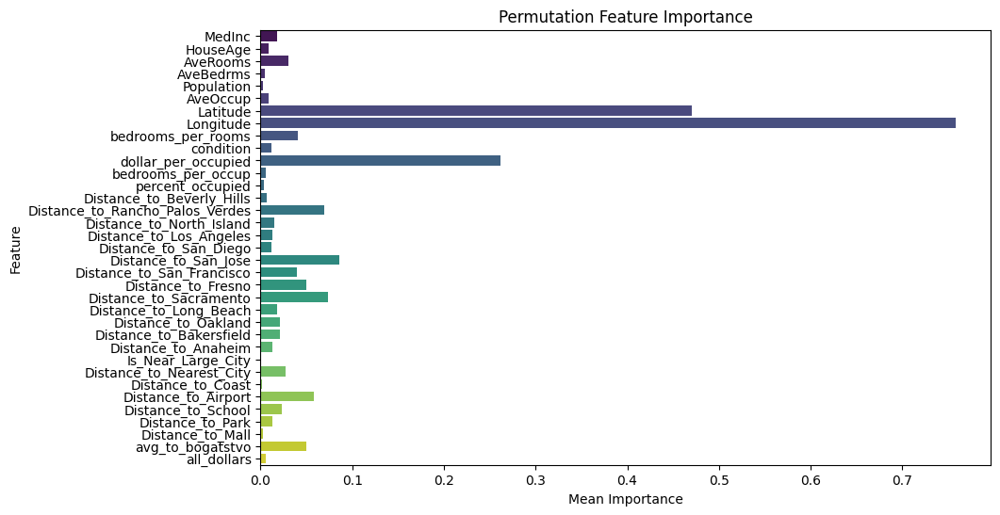

In [45]:
from sklearn.inspection import permutation_importance

result = permutation_importance(cat, X_test, y_test, n_repeats=30, random_state=42)

# Создание DataFrame для удобства
importance_df = pd.DataFrame({
    'feature': X_test.columns,
    'importance_mean': result.importances_mean,
    'importance_std': result.importances_std
})

# Построение графика с помощью Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='importance_mean', y='feature', data=importance_df, palette='viridis')
plt.title('Permutation Feature Importance')
plt.xlabel('Mean Importance')
plt.ylabel('Feature')
plt.show()

In [46]:
importance_df

,feature,importance_mean,importance_std
0,MedInc,0.017975,0.001401
1,HouseAge,0.008499,0.000907
2,AveRooms,0.030778,0.002034
3,AveBedrms,0.004835,0.000864
4,Population,0.002598,0.000722
5,AveOccup,0.009215,0.001105
6,Latitude,0.470312,0.010983
7,Longitude,0.758756,0.012210
8,bedrooms_per_rooms,0.041153,0.002896
9,condition,0.012221,0.001709


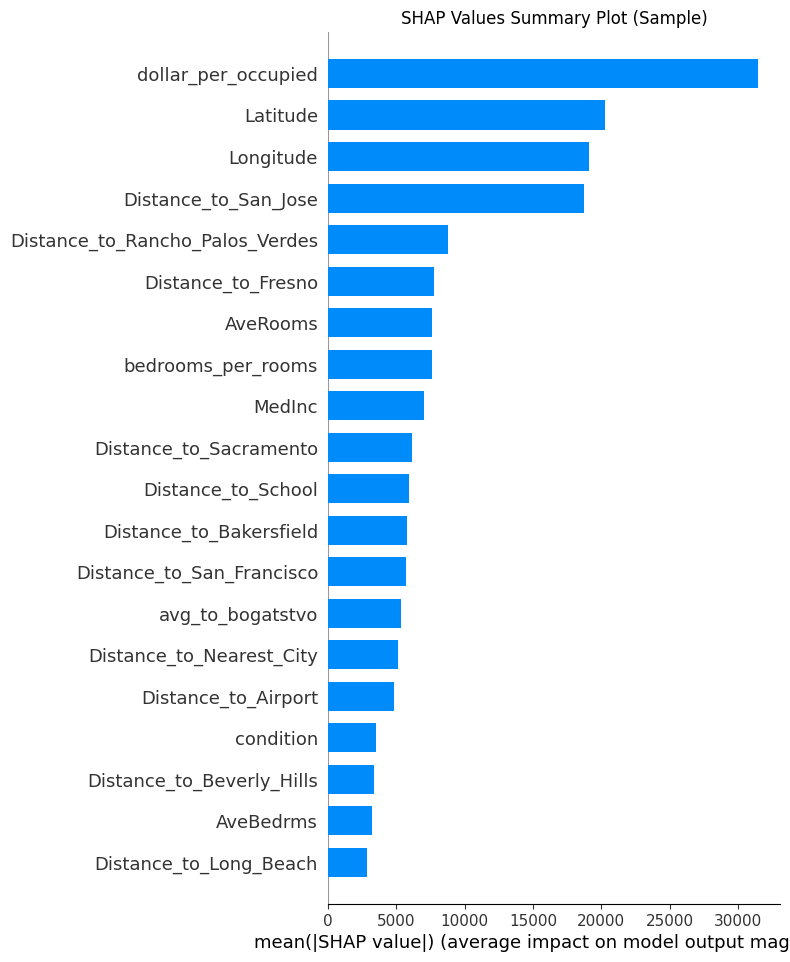

In [47]:
import shap

sample_size = 10
X_sample = X_test.sample(n=sample_size, random_state=42)

explainer = shap.TreeExplainer(cat)
shap_values = explainer.shap_values(X_sample)

shap.summary_plot(shap_values, X_sample, plot_type="bar", show=False)
plt.title('SHAP Values Summary Plot (Sample)')
plt.show()

MAE: 60780.21 | Real: 238499.99999999997 | Predicted: 299280.2123067548


<Figure size 640x480 with 0 Axes>

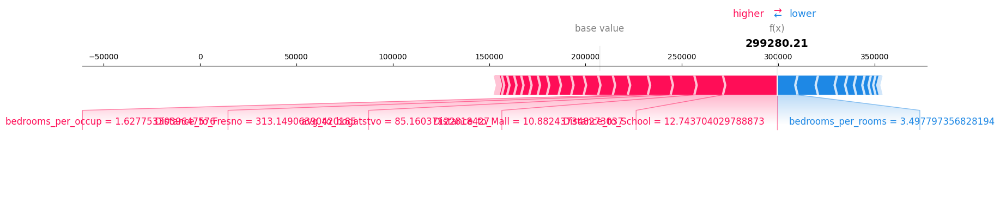

MAE: 141907.47 | Real: 329700.0 | Predicted: 187792.52914964524


<Figure size 640x480 with 0 Axes>

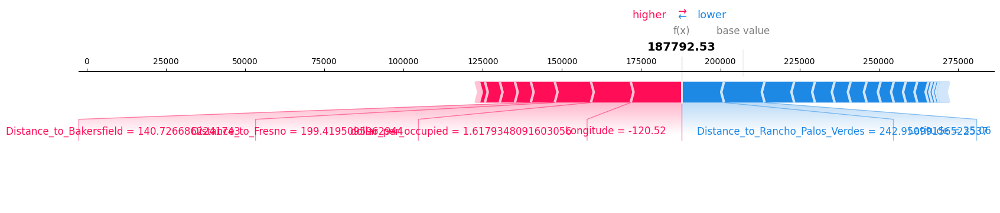

MAE: 8634.57 | Real: 95200.0 | Predicted: 103834.56765530253


<Figure size 640x480 with 0 Axes>

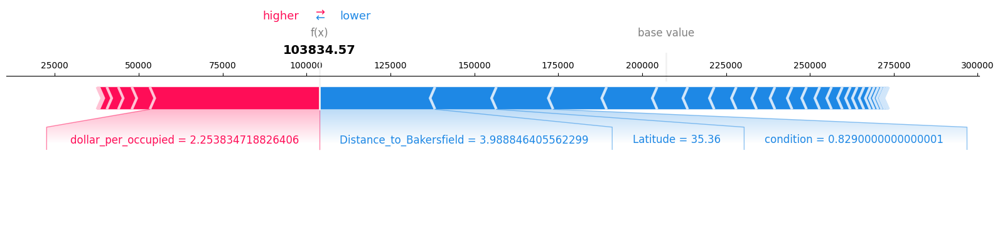

MAE: 4146.11 | Real: 245100.0 | Predicted: 240953.88509147687


<Figure size 640x480 with 0 Axes>

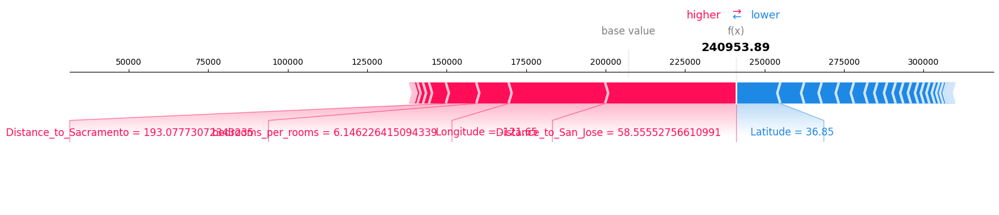

MAE: 18663.70 | Real: 64100.0 | Predicted: 82763.69647215307


<Figure size 640x480 with 0 Axes>

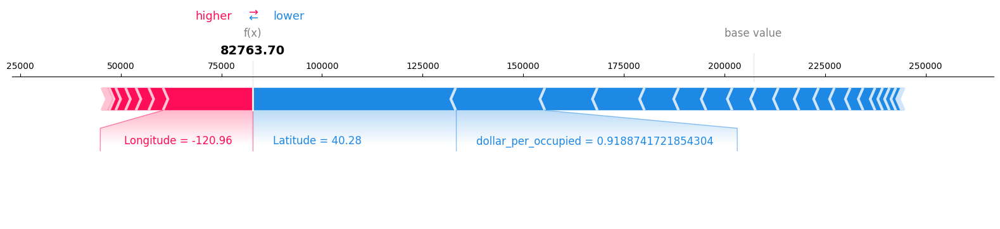

MAE: 42551.85 | Real: 376600.0 | Predicted: 334048.1513081177


<Figure size 640x480 with 0 Axes>

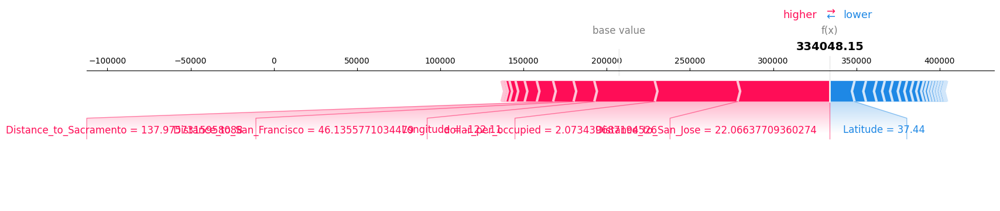

MAE: 4207.81 | Real: 230700.0 | Predicted: 226492.1940521129


<Figure size 640x480 with 0 Axes>

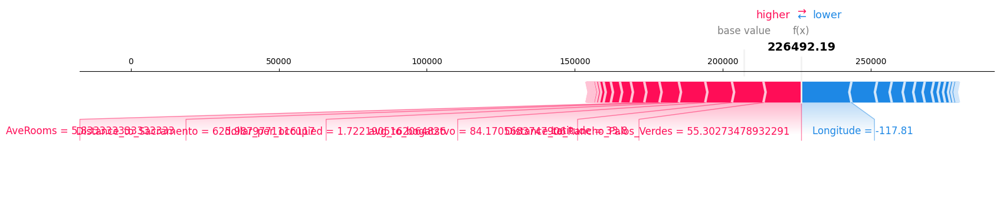

MAE: 7247.94 | Real: 175200.0 | Predicted: 182447.94200953696


<Figure size 640x480 with 0 Axes>

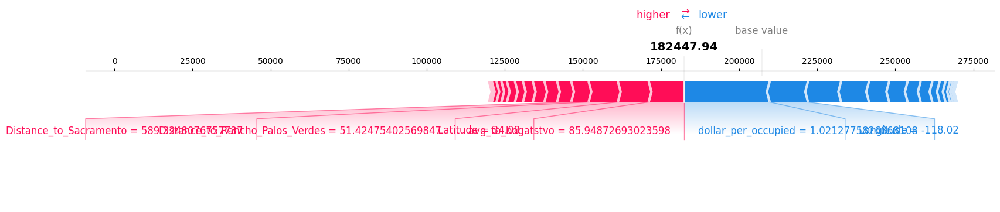

MAE: 28543.53 | Real: 416700.0 | Predicted: 445243.5335816757


<Figure size 640x480 with 0 Axes>

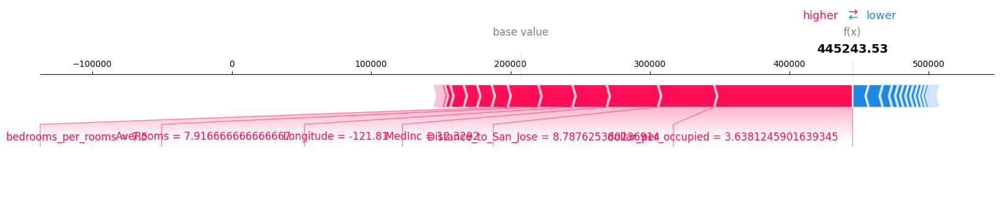

MAE: 17456.31 | Real: 93800.0 | Predicted: 76343.6883216508


<Figure size 640x480 with 0 Axes>

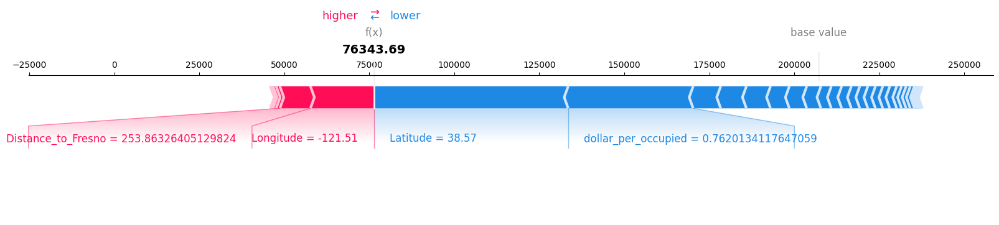

In [48]:
sample_size = 10
X_sample = X_test.sample(n=sample_size, random_state=42)
y_sample = y_test[X_sample.index]

explainer = shap.TreeExplainer(cat)
shap_values = explainer.shap_values(X_sample)

shap.initjs()
for i in range(sample_size):
    real_value = y_sample.iloc[i]
    predicted_value = cat.predict(X_sample.iloc[[i]])[0]
    mae = mean_absolute_error([real_value], [predicted_value])
    
    plt.figure()
    print(f'MAE: {mae:.2f} | Real: {real_value} | Predicted: {predicted_value}')
    shap.force_plot(explainer.expected_value, shap_values[i], X_sample.iloc[i], matplotlib=True)
    plt.show()